In [2]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
from matplotlib import font_manager
from scipy.optimize import curve_fit
from matplotlib.pyplot import cm
import statistics

plt.style.use('seaborn-v0_8-bright')
hfont = {'fontname': 'Times'}
csfont = {'fontname':'Didot'}
font = font_manager.FontProperties(family='Times',
                                   style='normal', size=10)



## Number of Nodes Analysis

In [3]:
df_n_2_old = pd.read_csv('aspl_results/old_nodes_data/aspl_nodes_2_2024-02-29 17:00:48.462591.csv')
df_n_3_old = pd.read_csv('aspl_results/old_nodes_data/aspl_nodes_3_2024-02-29 13:13:02.350284.csv')
df_n_4_old = pd.read_csv('aspl_results/old_nodes_data/aspl_nodes_4_2024-02-29 13:52:26.623739.csv')
df_n_5 = pd.read_csv('aspl_results/aspl_nodes_5_2024-03-01 19:03:47.565341.csv')
df_n_6 = pd.read_csv('aspl_results/aspl_nodes_6_2024-03-01 19:18:44.642127.csv')
df_n_7 = pd.read_csv('aspl_results/aspl_nodes_7_2024-03-01 19:33:45.010746.csv')
df_n_8 = pd.read_csv('aspl_results/aspl_nodes_8_2024-03-01 19:53:01.865119.csv')



# df_n_4 = pd.read_csv('aspl_nodes_4_2024-02-29 13:52:26.623739.csv')

df_n_2_old = df_n_2_old.drop(['Unnamed: 0'], axis = 1)
df_n_3_old = df_n_3_old.drop(['Unnamed: 0'], axis = 1)
df_n_4_old = df_n_4_old.drop(['Unnamed: 0'], axis = 1)
df_n_5 = df_n_5.drop(['Unnamed: 0'], axis = 1)
df_n_6 = df_n_6.drop(['Unnamed: 0'], axis = 1)
df_n_7 = df_n_7.drop(['Unnamed: 0'], axis = 1)
df_n_8 = df_n_8.drop(['Unnamed: 0'], axis = 1)
# df_n_2 = df_n_2.drop(['Unnamed: 0'], axis = 1)
# df_n_3 = df_n_3.drop(['Unnamed: 0'], axis = 1)
# df_n_4 = df_n_4.drop(['Unnamed: 0'], axis = 1)

# df_n_4 = df_n_4.drop(['Unnamed: 0'], axis = 1)

# df_n = [df_n_2, df_n_3, df_n_4]
df_n_old = [df_n_2_old, df_n_3_old, df_n_4_old, df_n_5, df_n_6, df_n_7, df_n_8]
# df_n = [df_n_2, df_n_3, df_n_4, df_n_5, df_n_6, df_n_7, df_n_8]


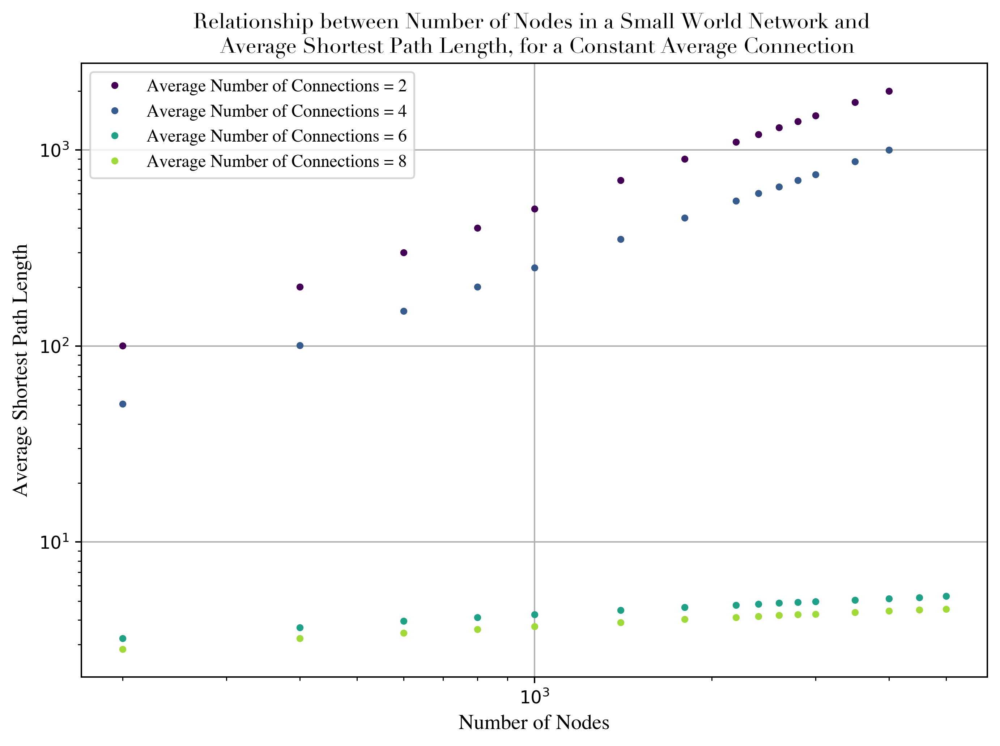

In [7]:
# df_n
plt.figure(figsize=(8, 6), dpi = 350)
cons = [2, 3, 4, 5, 6, 7, 8]

for i in range(0, len(df_n_old), 2):
    # display(df_n[i])
    plt.plot(df_n_old[i]['Number of Nodes'], df_n_old[i]['Mean ASPL'], '.', color = cm.viridis(i/len(df_n_old)), label = 'Average Number of Connections = {}'.format(cons[i]))

plt.xlabel('Number of Nodes', fontsize = 12, **hfont)
plt.ylabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.title('Relationship between Number of Nodes in a Small World Network and \n Average Shortest Path Length, for a Constant Average Connection', fontsize = 12, **csfont)
plt.legend(prop = font)
plt.grid()
plt.yscale('log')
plt.xscale('log')
plt.tight_layout()
plt.show()

### Total Infected Percentage

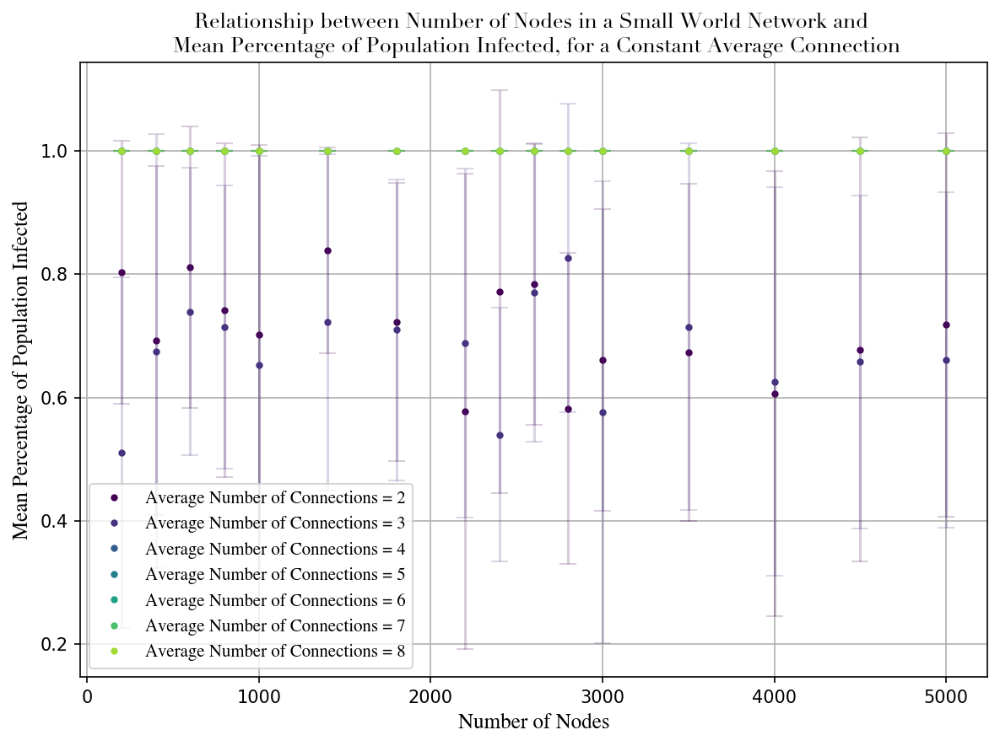

In [45]:
plt.figure(figsize=(8, 6), dpi = 150)

for i in range(len(df_n)):
    # display(df_n[i])
    plt.plot(df_n[i]['Number of Nodes'], df_n[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_n)), label = 'Average Number of Connections = {}'.format(cons[i]))
    plt.errorbar(df_n[i]['Number of Nodes'], df_n[i]['Mean Percentage of Population Infected'], df_n[i]['Std. Dev Percentage of Population Infected'], ls = '', capsize = 5, color = cm.viridis(i/len(df_n)), alpha = 0.2)

plt.xlabel('Number of Nodes', fontsize = 12, **hfont)
plt.ylabel('Mean Percentage of Population Infected', fontsize = 12, **hfont)
plt.title('Relationship between Number of Nodes in a Small World Network and \n Mean Percentage of Population Infected, for a Constant Average Connection', fontsize = 12, **csfont)
plt.legend(prop = font)
plt.grid()
plt.tight_layout()
plt.show()

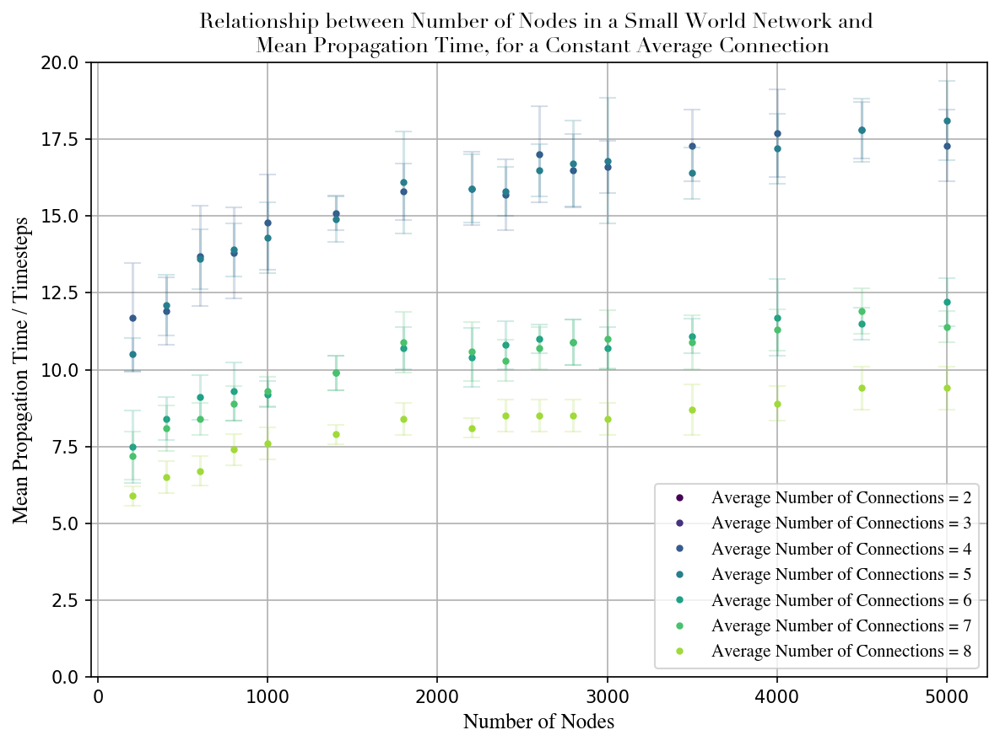

In [50]:
plt.figure(figsize=(8, 6), dpi = 150)

for i in range(len(df_n)):
    # display(df_n[i])
    plt.plot(df_n[i]['Number of Nodes'], df_n[i]['Mean Propagation Time'], '.', color = cm.viridis(i/len(df_n)), label = 'Average Number of Connections = {}'.format(cons[i]))
    plt.errorbar(df_n[i]['Number of Nodes'], df_n[i]['Mean Propagation Time'], df_n[i]['Std. Dev. Propagation Time'], ls = '', capsize = 5, color = cm.viridis(i/len(df_n)), alpha = 0.2)

plt.xlabel('Number of Nodes', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time / Timesteps', fontsize = 12, **hfont)
plt.title('Relationship between Number of Nodes in a Small World Network and \n Mean Propagation Time, for a Constant Average Connection', fontsize = 12, **csfont)
plt.legend(prop = font)
plt.grid()
# plt.yscale('log')
plt.ylim(0, 20)
plt.tight_layout()
plt.show()

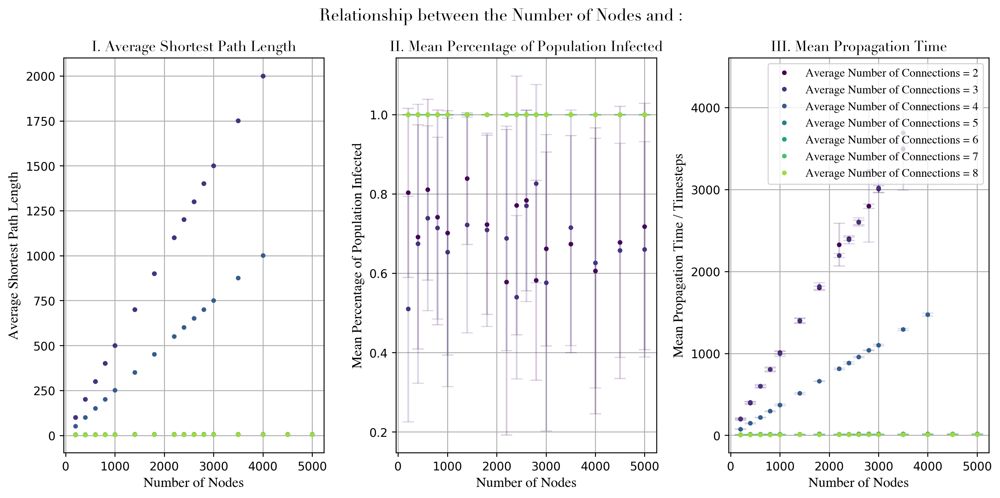

In [47]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex = True, figsize = (12, 6), dpi = 250)

cons = [2, 3, 4, 5, 6, 7, 8]

for i in range(len(df_n_old)):
    # display(df_n[i])
    ax1.plot(df_n_old[i]['Number of Nodes'], df_n_old[i]['Mean ASPL'], '.', color = cm.viridis(i/len(df_n_old)), label = 'Average Number of Connections = {}'.format(cons[i]))

    ax2.plot(df_n[i]['Number of Nodes'], df_n[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_n)), label = 'Average Number of Connections = {}'.format(cons[i]))
    ax2.errorbar(df_n[i]['Number of Nodes'], df_n[i]['Mean Percentage of Population Infected'], df_n[i]['Std. Dev Percentage of Population Infected'], ls = '', capsize = 5, color = cm.viridis(i/len(df_n)), alpha = 0.2)

    ax3.plot(df_n_old[i]['Number of Nodes'], df_n_old[i]['Mean Propagation Time'], '.', color = cm.viridis(i/len(df_n_old)), label = 'Average Number of Connections = {}'.format(cons[i]))
    ax3.errorbar(df_n_old[i]['Number of Nodes'], df_n_old[i]['Mean Propagation Time'], df_n_old[i]['Std. Dev. Propagation Time'], ls = '', capsize = 5, color = cm.viridis(i/len(df_n_old)), alpha = 0.2)



ax1.set_xlabel('Number of Nodes', fontsize = 12, **hfont)
ax1.set_ylabel('Average Shortest Path Length', fontsize = 12, **hfont)
ax1.set_title('I. Average Shortest Path Length', fontsize = 12, **csfont)
# ax1.legend(prop = font)
ax1.grid()
    
ax2.set_xlabel('Number of Nodes', fontsize = 12, **hfont)
ax2.set_ylabel('Mean Percentage of Population Infected', fontsize = 12, **hfont)
ax2.set_title('II. Mean Percentage of Population Infected', fontsize = 12, **csfont)
# ax2.legend(prop = font)
ax2.grid()

ax3.set_xlabel('Number of Nodes', fontsize = 12, **hfont)
ax3.set_ylabel('Mean Propagation Time / Timesteps', fontsize = 12, **hfont)
ax3.set_title('III. Mean Propagation Time', fontsize = 12, **csfont)
ax3.legend(prop = font)
ax3.grid()

# fig.legend(prop = font)
fig.suptitle('Relationship between the Number of Nodes and :', fontsize = 14, **csfont)

plt.tight_layout()
plt.show()

## Probability of Infection

In [37]:
df_p_2 = pd.read_csv('aspl_results/aspl_prob_inf_0313/aspl_prob_inf_2_2024-03-13.csv')
df_p_2 = df_p_2.drop(['Unnamed: 0'], axis = 1)
#display(df_p_2)

df_p_4 = pd.read_csv('aspl_results/aspl_prob_inf_0313/aspl_prob_inf_4_2024-03-13.csv')
df_p_4 = df_p_4.drop(['Unnamed: 0'], axis = 1)
#display(df_p_4)

df_p_6 = pd.read_csv('aspl_results/aspl_prob_inf_0313/aspl_prob_inf_6_2024-03-13.csv')
df_p_6 = df_p_6.drop(['Unnamed: 0'], axis = 1)
#display(df_p_6_n)

# df_p = [df_p_2, df_p_3, df_p_4]
df_p = [df_p_2, df_p_4, df_p_6]

Avg. N of Connections:  2
[4988.99584049   39.95112092  147.28259555]
[[4.36816073e+04 3.35188054e+02 3.75840271e+02]
 [3.35188054e+02 3.65486663e+00 9.68453935e+00]
 [3.75840271e+02 9.68453935e+00 2.19161970e+02]]
Avg. N of Connections:  4
[796.97984164  41.79171456  27.47343905]
[[1843.63486322   91.86835599   15.15929058]
 [  91.86835599    6.40154596    2.42425385]
 [  15.15929058    2.42425385    8.2266421 ]]
Avg. N of Connections:  6
[601.95951445  41.70967778  20.79058703]
[[1046.84698568   68.95480609    8.62480045]
 [  68.95480609    6.35583444    1.82677562]
 [   8.62480045    1.82677562    4.6951805 ]]


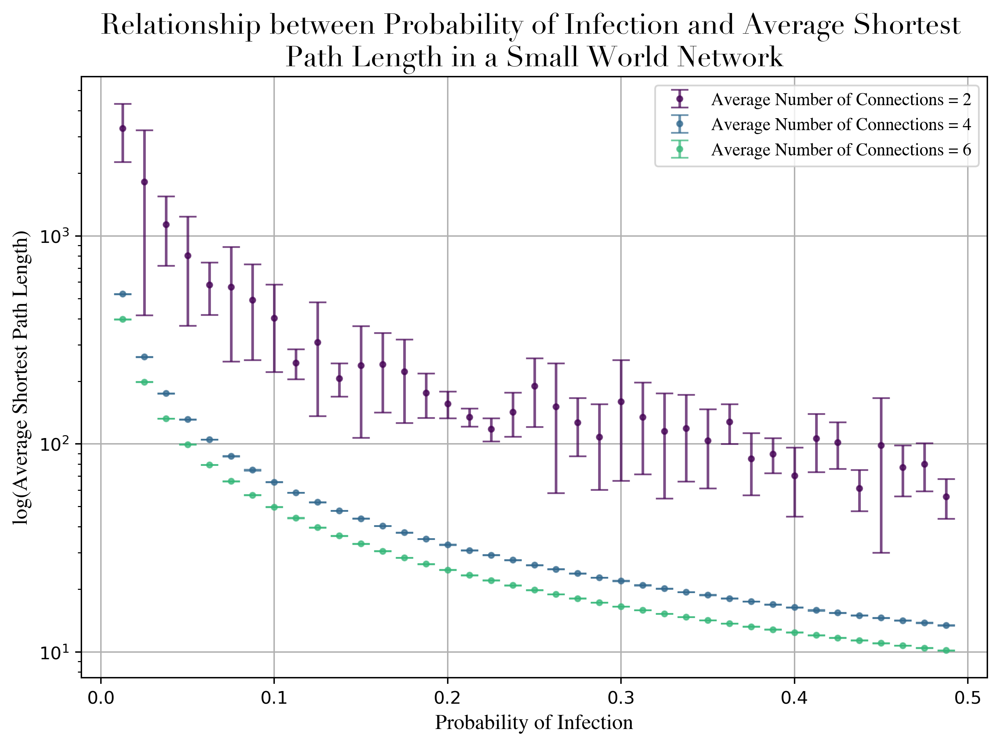

In [38]:
def func(x, a, b, c):
    return a * np.exp(-b * x) + c

plt.figure(figsize=(8, 6), dpi = 350)

# p_cons = [2, 3, 4]
p_cons = [2,4, 6]

#fig, (ax1,ax2) = plt.subplots(1,2)
for i in range(len(df_p)):
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], yerr=df_p[i]['STD ASPL'], marker ='.',
                 color = cm.viridis(i/len(df_p)), label = 'Average Number of Connections = {}'.format(p_cons[i]), capsize = 5,
                alpha = 0.7, ls = '')
    #if i != 0:
    #    ax2.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], '.',color = cm.viridis(i/len(df_p)), label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    popt, pcov = curve_fit(func, df_p[i]['Probability of Infection'], df_p[i]['Mean ASPL'])
    print('Avg. N of Connections: ', p_cons[i])
    print(popt)
    print(pcov)

    xx = np.linspace(0, 0.5)
    #plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    #if i != 0:
    #    ax2.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    #plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                    func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    #if i != 0:
    #    ax2.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                    func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    

plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel(r'log(Average Shortest Path Length)',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Shortest \n Path Length in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
plt.yscale('log')
plt.tight_layout()
plt.show()

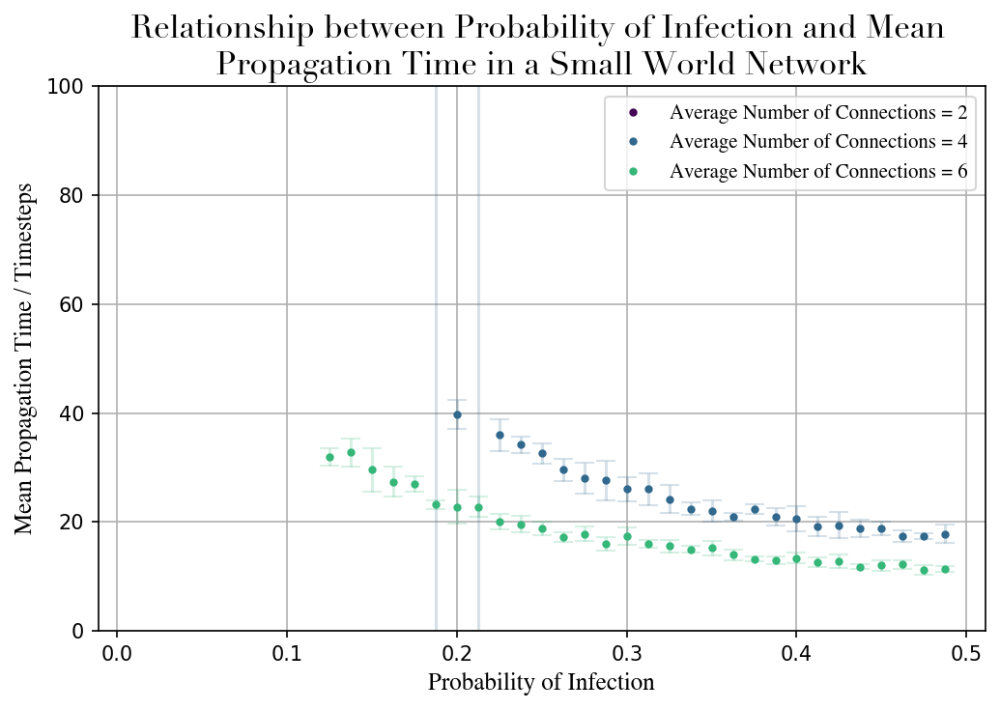

In [229]:
plt.figure(figsize=(7, 5), dpi = 150)

for i in range(len(df_p)):
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 1e8]
    #if len(valid_data_p) == 0:
    #    continue
    
    # plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
    #          label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], df_p[i]['Std. Dev. Propagation Time'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    #popt, pcov = curve_fit(func, valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    #print('Avg. N of Connections: ', p_cons[i])
    #print(popt)
    #print(pcov)

    xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
plt.ylim(0, 100)
plt.title('Relationship between Probability of Infection and Mean \n Propagation Time in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font)
# plt.yscale('log')
plt.grid()
plt.tight_layout()
plt.show()

In [81]:
# fit sigmoid curve

def sigmoid(x ,x0, k, b):
    y = 1 / (1 + np.exp(-k*(x-x0))) + b
    return (y)

Avg. N of Connections:  2
[  0.27030516 -11.8067732    0.92891057]
[[ 3.10865464e-04 -1.09300286e-02  4.50813695e-04]
 [-1.09300286e-02  2.02110335e+00 -3.26728727e-02]
 [ 4.50813695e-04 -3.26728727e-02  9.66882507e-04]]
Avg. N of Connections:  4
[ 3.61014638e-02 -2.77867670e+02  9.93925135e-01]
[[ 6.45321900e-08 -2.90979989e-03  1.17977886e-07]
 [-2.90979989e-03  7.06827194e+02 -3.50417942e-03]
 [ 1.17977886e-07 -3.50417942e-03  5.69212536e-06]]
Avg. N of Connections:  6
[ 2.19277455e-02 -4.99277079e+02  9.96707182e-01]
[[ 2.81728728e-07 -4.34903228e-02  1.32684758e-07]
 [-4.34903228e-02  7.13327199e+03 -1.68621672e-02]
 [ 1.32684758e-07 -1.68621672e-02  2.09385847e-06]]


/var/folders/_z/js6kczb16373q18ffxtmcvxm0000gn/T/ipykernel_60824/3928454475.py:4: RuntimeWarning: overflow encountered in exp
  y = -1 / (1 + np.exp(-k*(x-x0))) + b


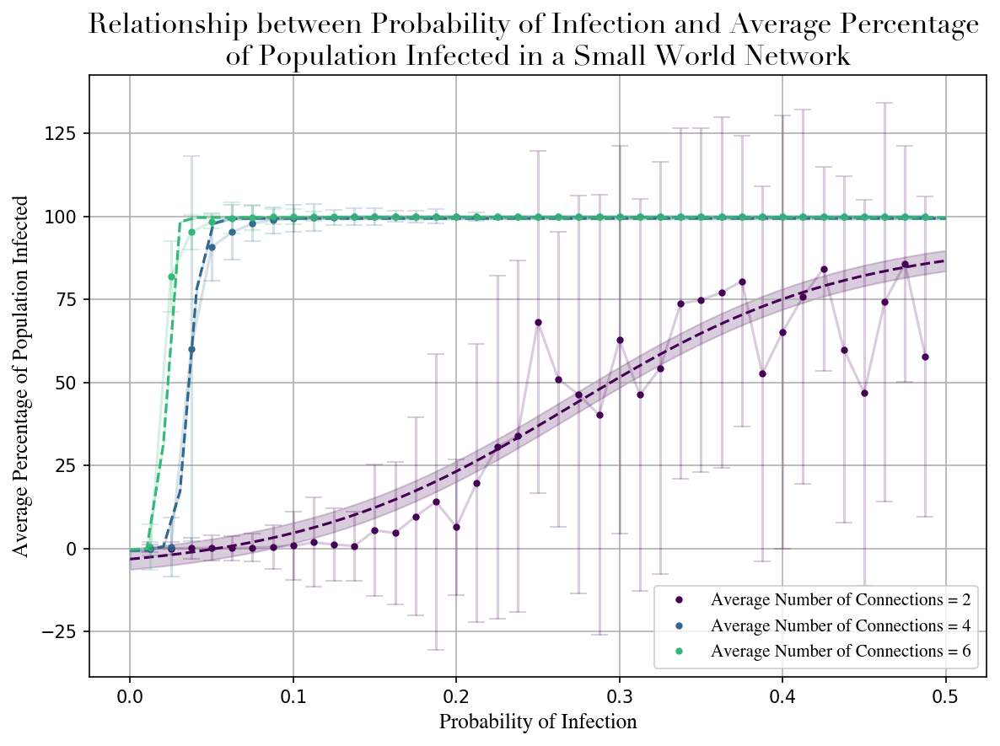

In [40]:
plt.figure(figsize=(8, 6), dpi = 150)

for i in range(len(df_p)):
    plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected']*100, '.', color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected']*100, 100*np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected']), 
                 color = cm.viridis(i/len(df_p)), ls = None, alpha = 0.2, capsize = 5)

    if i == 0:
        popt, pcov = curve_fit(sigmoid, df_p[i]['Probability of Infection'], df_p[i]['Mean Percentage of Population Infected'], 
                              sigma= np.sqrt(1/df_p[i]['STD ASPL']))
        print('Avg. N of Connections: ', p_cons[i])
        print(popt)
        print(pcov)

        xx = np.linspace(0, 0.5)
        plt.plot(xx, 100*sigmoid(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')

        plt.fill_between(xx, 100*sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                            100*sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)

    else:
        xvals = [df_p[i]['Probability of Infection'][j] if j < 39 else (j-39)*-0.01 for j in range(43)]
        yvals = [df_p[i]['Mean Percentage of Population Infected'][j] if j < 39 else 0.01*(39-j) for j in range(43)]
        yerr = [np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected'][j]) if j < 39 else 0 for j in range(43)]
        popt, pcov = curve_fit(sigmoid, xvals, yvals)
        print('Avg. N of Connections: ', p_cons[i])
        print(popt)
        print(pcov)

        xx = np.linspace(0, 0.5)
        plt.plot(xx, sigmoid(xx, *popt)*100, color = cm.viridis(i/len(df_p)), ls = '--')

        plt.fill_between(xx, 100*sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                            100*sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Average Percentage of Population Infected',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Percentage \n of Population Infected in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()

### Subplots

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

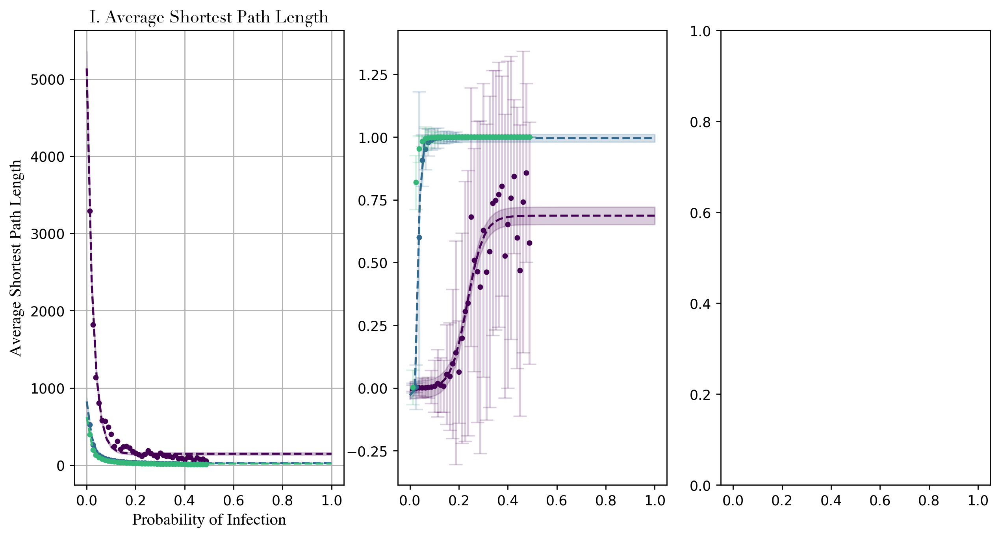

In [65]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex = True, figsize = (12, 6), dpi = 250)

p_cons = [2, 4, 6]

for i in range(len(df_p)):
    ax1.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], '.',color = cm.viridis(i/len(df_p)), label = 'Average Number of Connections = {}'.format(p_cons[i]))

    popt, pcov = curve_fit(func, df_p[i]['Probability of Infection'], df_p[i]['Mean ASPL'])
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    xx = np.linspace(0, 1)
    ax1.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    ax1.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                        func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


ax1.set_xlabel('Probability of Infection', fontsize = 12, **hfont)
ax1.set_ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
ax1.set_title('I. Average Shortest Path Length', fontsize = 12, **csfont)
# ax1.legend(prop = font)
ax1.grid()

for i in range(len(df_p)):
    ax2.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    ax2.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected']), 
                 color = cm.viridis(i/len(df_p)), ls = '', alpha = 0.2, capsize = 5)


    popt, pcov = curve_fit(sigmoid, df_p[i]['Probability of Infection'], df_p[i]['Mean Percentage of Population Infected'])
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    xx = np.linspace(0, 1)
    ax2.plot(xx, sigmoid(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')

    ax2.fill_between(xx, sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                        sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


ax2.set_xlabel('Probability of Infection', fontsize = 12, **hfont)
ax2.set_ylabel('Average Percentage of Population Infected',fontsize = 12,  **hfont)
ax2.set_title('II. Average Percentage of Population Infected', fontsize = 12, **csfont)
ax2.legend(prop = font)
ax2.grid()


for i in range(len(df_p)):
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]

    # plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
    #          label = 'Average Number of Connections = {}'.format(p_cons[i]))
    ax3.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], df_p[i]['Std. Dev. Propagation Time'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    ax3.plot(valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    ax3.fill_between(xx, [5000 for i in xx], [7000 for i in xx], color = 'tab:red', alpha = 0.15, label = 'Contained')
    
    # popt, pcov = curve_fit(func, valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


ax3.set_xlabel('Probability of Infection', fontsize = 12, **hfont)
ax3.set_ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
ax3.set_ylim(0, 6000)
ax3.set_title('III. Mean Propagation Time', fontsize = 12, **csfont)
# ax3.legend(prop = font)
# plt.yscale('log')
ax3.grid()

fig.suptitle('Relationship between Probability of Infection p and:',  fontsize = 14, **csfont)
# fig.legend(prop = font)
plt.tight_layout()
plt.show()



### ASPL against propagation time

39.69340678003779


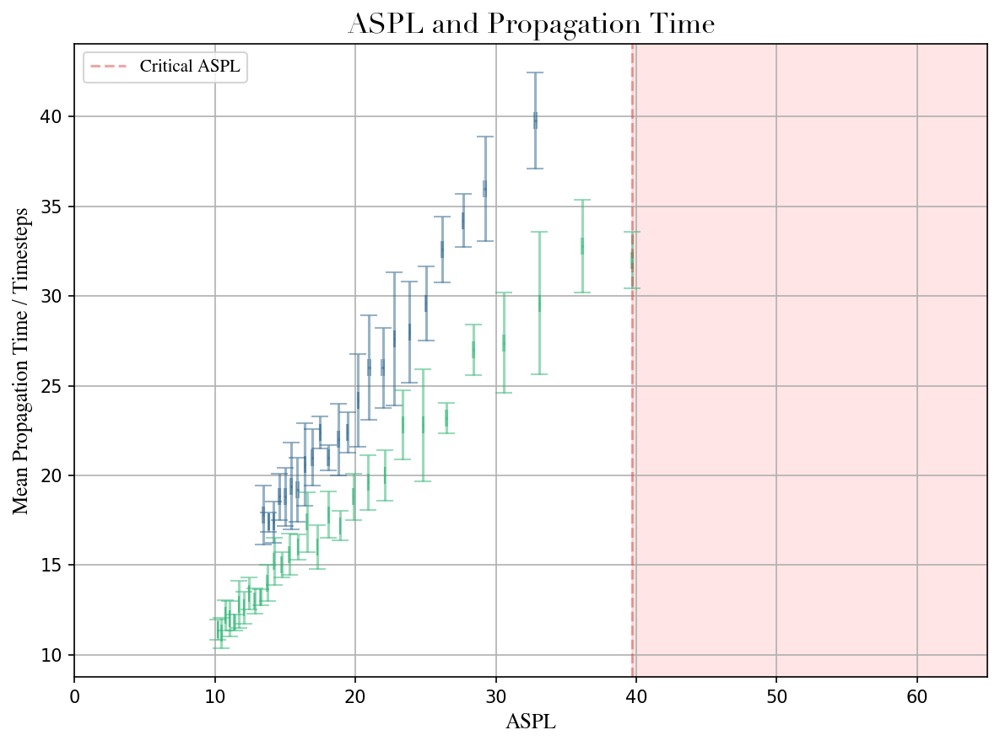

In [125]:
plt.figure(figsize=(8, 6), dpi = 150)
maxval = 0
for i in range(len(df_p)):
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]
    if len(valid_data_p) == 0:
        continue
    contained_data = df_p[i][df_p[i]['Mean Propagation Time'] >= 2e4]

    plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Propagation Time'], valid_data_p['Std. Dev. Propagation Time'], xerr = valid_data_p['STD ASPL'],
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.5)
    
    
    
    # plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    
    if max(valid_data_p['Mean ASPL']) > maxval:
        maxval = max(valid_data_p['Mean ASPL'])
    # popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)


    xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1669.1679172920158, color = 'tab:red', alpha = 0.4, ls = '--') # 4
# plt.axvline(x = 1875.625208402801, color = 'tab:red', alpha = 0.4, ls = '--') # 3
print(maxval)
plt.axvline(x = maxval, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
plt.axvspan(maxval, 1500.751875937969, alpha=0.1, color='red')

plt.xlabel('ASPL', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('ASPL and Propagation Time', fontsize = 16, **csfont)
plt.legend(prop = font)
# plt.yscale('log')
plt.xlim(0,65)
plt.grid()
plt.tight_layout()
plt.show()

### ASPL against Proportion of Population Infected

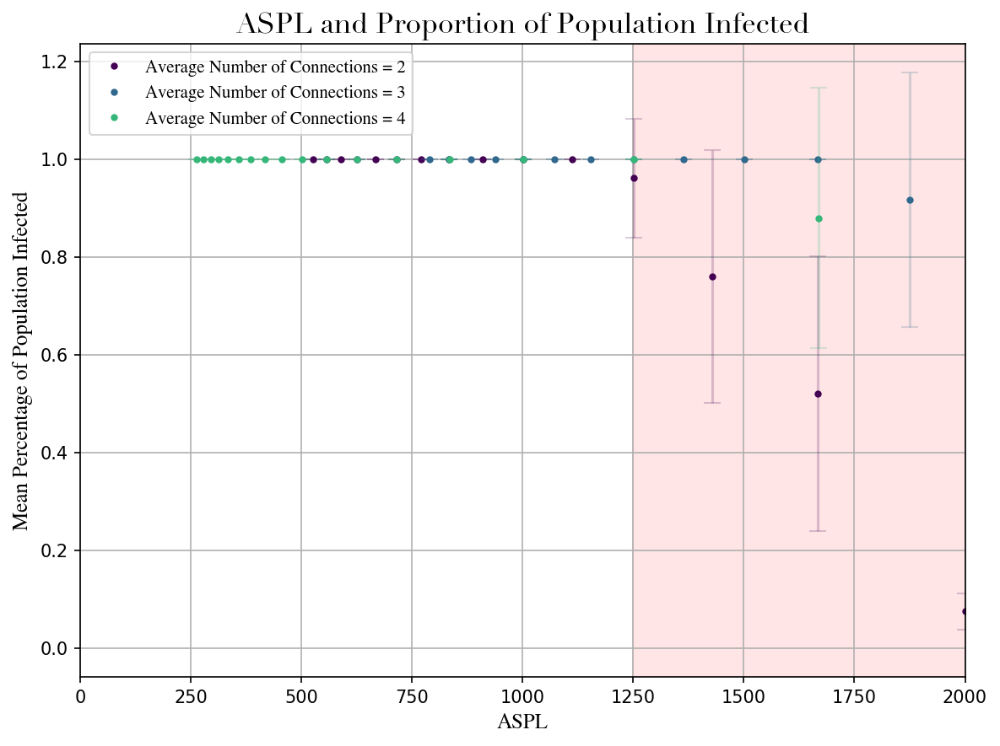

In [139]:
plt.figure(figsize=(8, 6), dpi = 150)

for i in range(len(df_p)):
    valid_data_p = df_p[i]

    plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Percentage of Population Infected'], valid_data_p['Std. Dev Percentage of Population Infected'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Mean ASPL'], valid_data_p['Mean Percentage of Population Infected'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    # plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    
    # popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)


    xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('ASPL', fontsize = 12, **hfont)
plt.ylabel('Mean Percentage of Population Infected',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('ASPL and Proportion of Population Infected', fontsize = 16, **csfont)
plt.legend(prop = font)
# plt.yscale('log')
plt.xlim(0, 2000)
plt.grid()
plt.tight_layout()
plt.show()

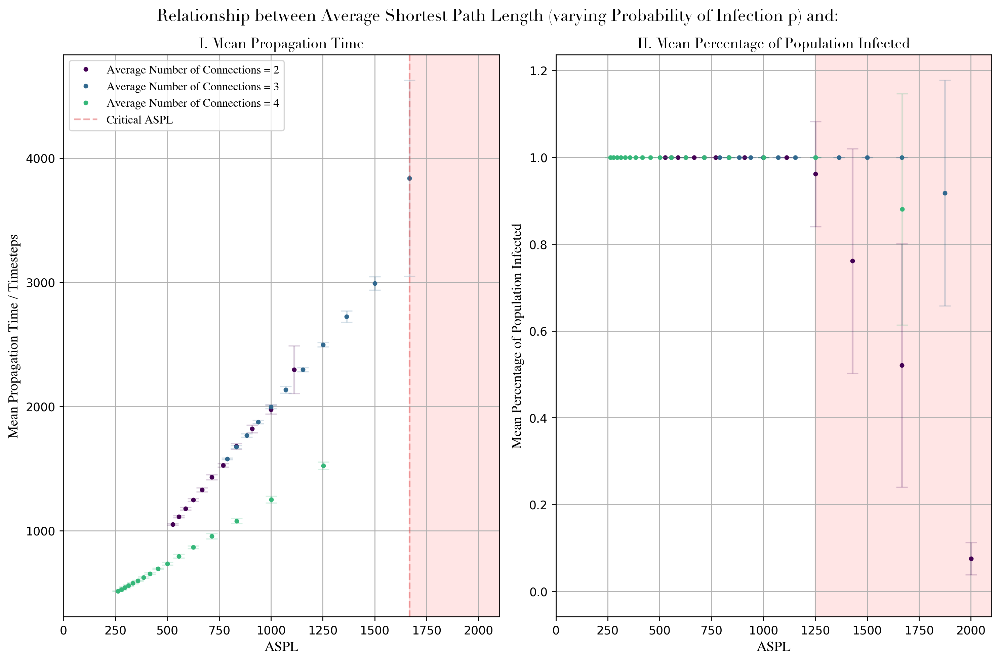

In [148]:
# subplots

fig, (ax1, ax2) = plt.subplots(1, 2, sharex = True, figsize = (12, 8), dpi = 250)

for i in range(len(df_p)):
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]
    contained_data = df_p[i][df_p[i]['Mean Propagation Time'] >= 2e4]

    ax1.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Propagation Time'], valid_data_p['Std. Dev. Propagation Time'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    ax1.plot(valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    # plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    
    # popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)


    # xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1669.1679172920158, color = 'tab:red', alpha = 0.4, ls = '--') # 4
# plt.axvline(x = 1875.625208402801, color = 'tab:red', alpha = 0.4, ls = '--') # 3
ax1.axvline(x = 1667.5004168750684, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
ax1.axvspan(1667.5004168750684, 2503.751875937969, alpha=0.1, color='red')

ax1.set_xlabel('ASPL', fontsize = 12, **hfont)
ax1.set_ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
ax1.set_title('I. Mean Propagation Time', fontsize = 12, **csfont)
ax1.legend(prop = font)
# plt.yscale('log')
ax1.set_xlim(0, 2100)
ax1.grid()

for i in range(len(df_p)):
    valid_data_p = df_p[i]

    ax2.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Percentage of Population Infected'], valid_data_p['Std. Dev Percentage of Population Infected'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    ax2.plot(valid_data_p['Mean ASPL'], valid_data_p['Mean Percentage of Population Infected'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    # plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    
    # popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)


    # xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
ax2.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

ax2.set_xlabel('ASPL', fontsize = 12, **hfont)
ax2.set_ylabel('Mean Percentage of Population Infected',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
ax2.set_title('II. Mean Percentage of Population Infected', fontsize = 12, **csfont)
# ax2.legend(prop = font)
# plt.yscale('log')
ax2.set_xlim(0, 2100)

ax2.grid()

fig.suptitle('Relationship between Average Shortest Path Length (varying Probability of Infection p) and: ', fontsize = 14, **csfont)
plt.tight_layout()
plt.show()


# Probability of Infection: Close Look

In [4]:
df_p_2 = pd.read_csv('aspl_results/prob_inf_0.00125/aspl_prob_inf_2_2024-03-04 11:20:11.415817.csv')
df_p_4 = pd.read_csv('aspl_results/prob_inf_0.00125/aspl_prob_inf_4_2024-03-04 11:47:35.642860.csv')
#df_p_2 = df_p_2.drop(['Unnamed: 0'], axis = 1)

#df_p_3 = pd.read_csv('prob_inf_0.00125/aspl_prob_inf_3_2024-03-04 11:33:21.646138.csv')
#df_p_3 = df_p_3.drop(['Unnamed: 0'], axis = 1)

# df_p_4 = pd.read_csv('aspl_prob_inf_4_2024-03-16.csv')
# df_p_4 = df_p_4.drop(['Unnamed: 0'], axis = 1)

# df_p_6 = pd.read_csv('aspl_prob_inf_6_2024-03-17.csv')
# df_p_6 = df_p_6.drop(['Unnamed: 0'], axis = 1)

# result_6 = df_p_6
# result_4 = df_p_4

# result_6 = result_6.sort_values(by = 'Probability of Infection')
# result_4 = result_4.sort_values(by = 'Probability of Infection')

# df_p = [result_4, result_6]

df_p = [df_p_2, df_p_4]

Avg. N of Connections:  2
[6.05563403e+04 4.16769335e+01 2.09354687e+03]
[[1.05942133e+07 6.93236804e+03 8.73542109e+04]
 [6.93236804e+03 6.34954265e+00 1.83947952e+02]
 [8.73542109e+04 1.83947952e+02 4.76143755e+04]]
Avg. N of Connections:  4
[30308.45852134    41.67695214  1047.82047742]
[[2.65386213e+06 3.46966234e+03 2.18822948e+04]
 [3.46966234e+03 6.34956216e+00 9.20660085e+01]
 [2.18822948e+04 9.20660085e+01 1.19274091e+04]]


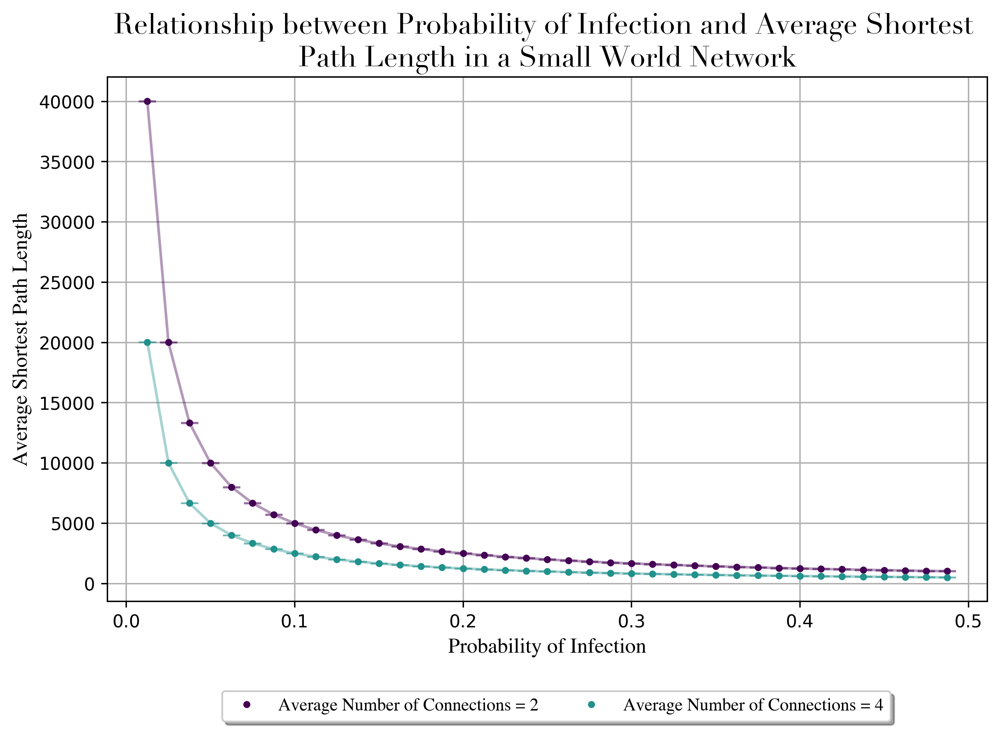

In [6]:
def func(x, a, b, c):
    return a * np.exp(-b * x) + c

plt.figure(figsize=(8, 6), dpi = 350)

p_cons = [2, 4]

for i in range(len(df_p)):
    plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], '.',color = cm.viridis(i/len(df_p)), label = 'Average Number of Connections = {}'.format(p_cons[i]))
    if p_cons[i] <=3:
        plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], yerr = 30, color = cm.viridis(i/len(df_p)), capsize = 5, alpha = 0.4)
    else:
        plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean ASPL'], yerr = 5, color = cm.viridis(i/len(df_p)), capsize = 5, alpha = 0.4)

    popt, pcov = curve_fit(func, df_p[i]['Probability of Infection'], df_p[i]['Mean ASPL'])
    print('Avg. N of Connections: ', p_cons[i])
    print(popt)
    print(pcov)

    xx = np.linspace(0, max(df_p[i]['Probability of Infection']) + 0.05)
    #plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    #plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    #plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Shortest \n Path Length in a Small World Network ', fontsize = 16, **csfont)
# plt.legend(prop = font, bbox_to_anchor=(0.2,-0.5))

plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()

,Unnamed: 0,Probability of Infection,Mean ASPL,Mean Percentage of Population Infected,Std. Dev Percentage of Population Infected,Mean Propagation Time,Std. Dev. Propagation Time,Probability of Outbreak
0,0,0.0125,40020.010005,0.00060,0.000211,999999999.0,0.000000e+00,0.0
1,1,0.0250,20010.005003,0.00125,0.000755,999999999.0,0.000000e+00,0.0
2,2,0.0375,13340.003335,0.00090,0.000459,999999999.0,0.000000e+00,0.0
3,3,0.0500,10005.002501,0.00165,0.000914,999999999.0,0.000000e+00,0.0
4,4,0.0625,8004.002001,0.00140,0.001022,999999999.0,0.000000e+00,0.0
5,5,0.0750,6670.001668,0.00285,0.001547,999999999.0,0.000000e+00,0.0
6,6,0.0875,5717.144286,0.00340,0.002998,999999999.0,0.000000e+00,0.0
7,7,0.1000,5002.501251,0.00430,0.003120,999999999.0,0.000000e+00,0.0
8,8,0.1125,4446.667778,0.00880,0.009670,999999999.0,0.000000e+00,0.0
9,9,0.1250,4002.001001,0.00780,0.006268,999999999.0,0.000000e+00,0.0


8


,Unnamed: 0,Probability of Infection,Mean ASPL,Mean Percentage of Population Infected,Std. Dev Percentage of Population Infected,Mean Propagation Time,Std. Dev. Propagation Time,Probability of Outbreak
0,0,0.0125,20030.015008,0.00085,0.000412,999999999.0,0.000000e+00,0.0
1,1,0.0250,10015.007504,0.00190,0.001308,999999999.0,0.000000e+00,0.0
2,2,0.0375,6676.671669,0.00405,0.003077,999999999.0,0.000000e+00,0.0
3,3,0.0500,5007.503752,0.01205,0.010510,999999999.0,0.000000e+00,0.0
4,4,0.0625,4006.003002,0.01600,0.009478,999999999.0,0.000000e+00,0.0
5,5,0.0750,3338.335835,0.04450,0.029093,999999999.0,0.000000e+00,0.0
6,6,0.0875,2861.430715,0.09055,0.061998,999999999.0,0.000000e+00,0.0
7,7,0.1000,2503.751876,0.13900,0.070455,999999999.0,0.000000e+00,0.0
8,8,0.1125,2225.557223,0.40260,0.287679,900000276.5,3.162269e+08,0.1
9,9,0.1250,2003.001501,0.58625,0.282339,800000641.6,4.216357e+08,0.2


26


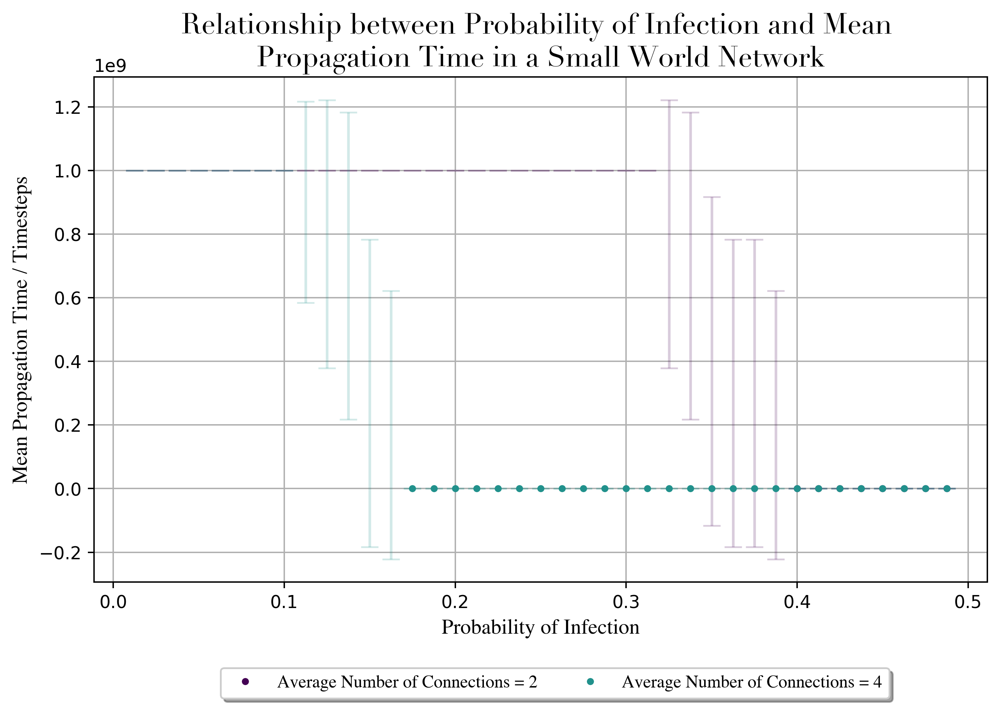

In [7]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    display(df_p[i])
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]

    # plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
    #          label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Propagation Time'], df_p[i]['Std. Dev. Propagation Time'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    print(len(valid_data_p))
    # popt, pcov = curve_fit(func, valid_data_p['Probability of Infection'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    # xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
#plt.ylim(0, 100)
plt.title('Relationship between Probability of Infection and Mean \n Propagation Time in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
#plt.yscale('log')
plt.grid()
plt.tight_layout()
plt.show()

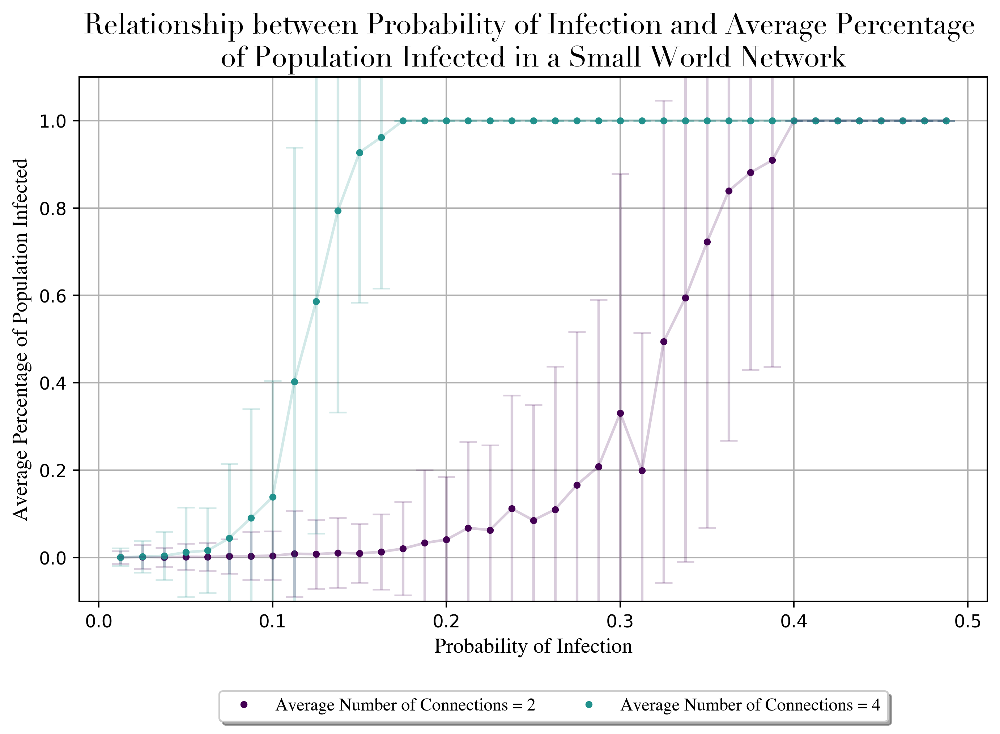

In [8]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected']), 
                 color = cm.viridis(i/len(df_p)), ls = None, alpha = 0.2, capsize = 5)


    # popt, pcov = curve_fit(sigmoid, df_p[i]['Probability of Infection'], df_p[i]['Mean Percentage of Population Infected'])
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    # xx = np.linspace(0, 1)
    # plt.plot(xx, sigmoid(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')

    # plt.fill_between(xx, sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Average Percentage of Population Infected',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Percentage \n of Population Infected in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
plt.grid()
plt.ylim(-0.1, 1.1)
# plt.yscale('log')
plt.tight_layout()
plt.show()

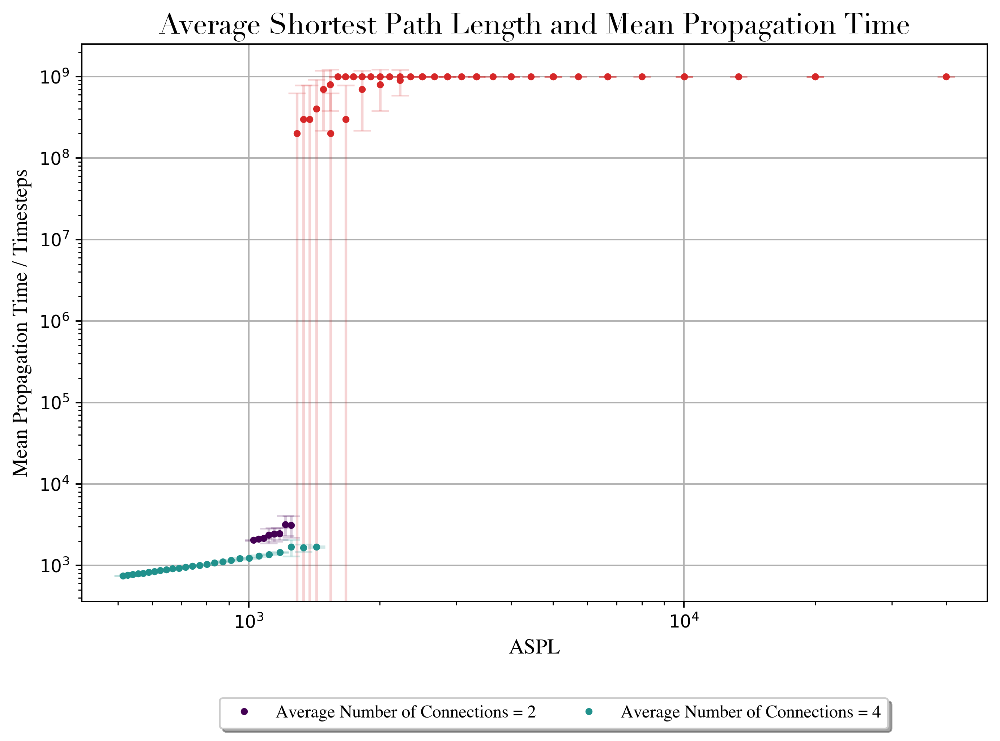

In [9]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):

    # valid_data_p = df_p[i]
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]
    contained_data = df_p[i][df_p[i]['Mean Propagation Time'] >= 2e4]

    plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Propagation Time'], valid_data_p['Std. Dev. Propagation Time'], 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    plt.errorbar(contained_data['Mean ASPL'],contained_data['Mean Propagation Time'], contained_data['Std. Dev. Propagation Time'], 
                 color = 'tab:red', linestyle = '', capsize = 5, alpha = 0.2)



    xx = np.linspace(0, 1)


plt.xlabel('ASPL', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Average Shortest Path Length and Mean Propagation Time', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
plt.yscale('log')
# plt.xlim(0, 2000)
plt.xscale('log')
plt.grid()
plt.tight_layout()
plt.show()

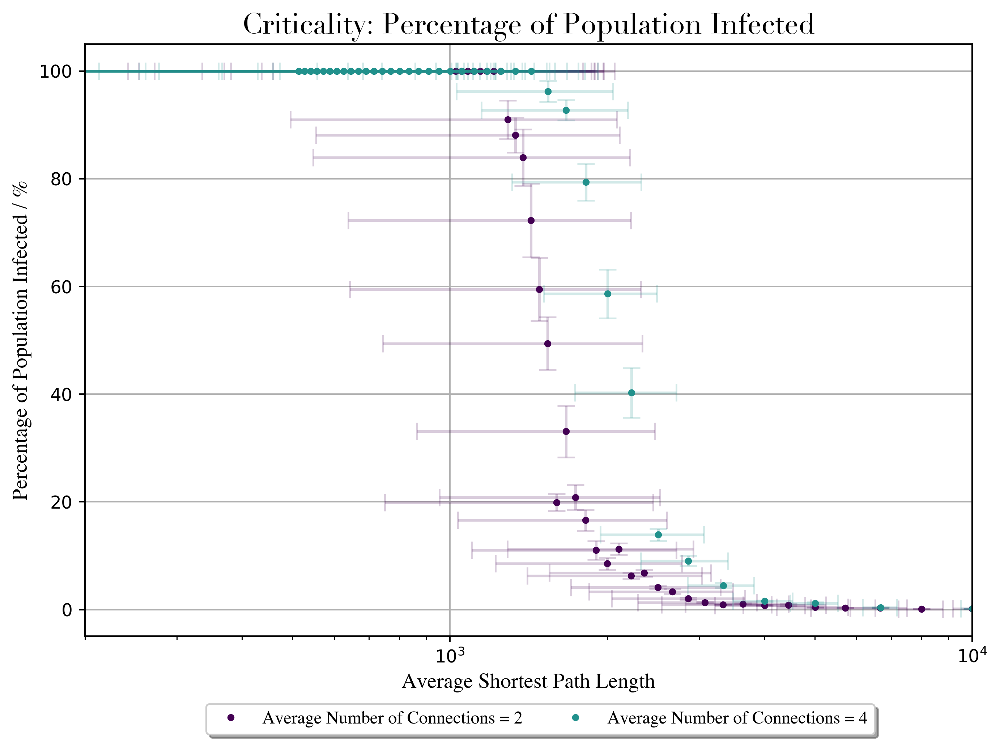

In [23]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    valid_data_p = df_p[i]

    if p_cons[i] == 2:
        xnoise = np.random.normal(800, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],100*valid_data_p['Mean Percentage of Population Infected'], xerr = xnoise, yerr = 100*np.array(valid_data_p['Std. Dev Percentage of Population Infected'])/np.sqrt(len(valid_data_p['Std. Dev Percentage of Population Infected'])), 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    else:
        xnoise = np.random.normal(500, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],100*valid_data_p['Mean Percentage of Population Infected'], xerr = xnoise, yerr = 100*np.array(valid_data_p['Std. Dev Percentage of Population Infected'])/np.sqrt(len(valid_data_p['Std. Dev Percentage of Population Infected'])), 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Mean ASPL'], 100*valid_data_p['Mean Percentage of Population Infected'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    # plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')
    
    # popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], maxfev = 10000)
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)


    xx = np.linspace(0, 1)
    # plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Percentage of Population Infected / %',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Criticality: Percentage of Population Infected', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.14),
          ncol=2, fancybox=True, shadow=True)
plt.xscale('log')
plt.xlim(2e2, 1e4)
plt.grid()
plt.tight_layout()
plt.show()

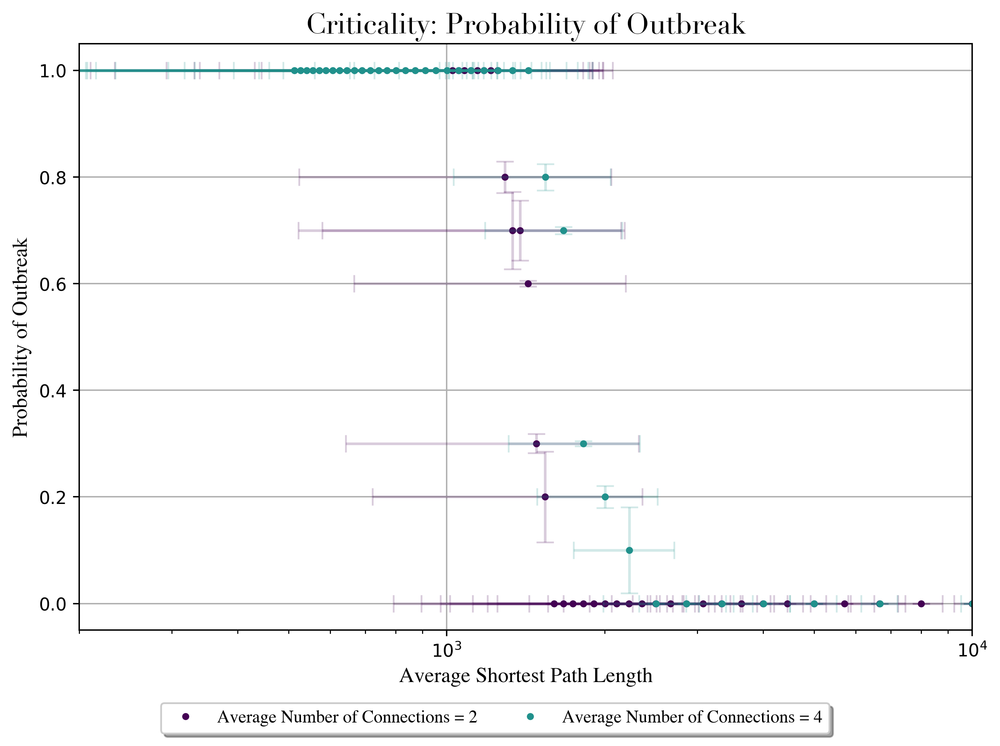

In [29]:
import random
plt.figure(figsize=(8, 6), dpi = 350)
def sigmoid(x ,x0, k, b):
    y = -1 / (1 + np.exp(-k*(x-x0))) + b
    return (y)

for i in range(len(df_p)):
    valid_data_p = df_p[i]
    
    plt.plot(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    yer = [0 if v == 1 or v == 0 else random.uniform(0,0.1) for v in valid_data_p['Probability of Outbreak']]
    if p_cons[i] == 2:
        xnoise = np.random.normal(800, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], xerr = xnoise, yerr = yer, color = cm.viridis(i/len(df_p)), 
                     linestyle = '', capsize = 5, alpha = 0.2)
    else: 
        xnoise = np.random.normal(500, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], xerr = xnoise, yerr = yer, color = cm.viridis(i/len(df_p)), 
                     linestyle = '', capsize = 5, alpha = 0.2)
    
    # popt1, pcov1 = curve_fit(sigmoid, valid_data_p["Mean ASPL"], valid_data_p["Probability of Outbreak"], p0 = [100, 40, 1])
    # print(popt1)
    # print(pcov1)

    xx = np.linspace(0, max(valid_data_p["Mean ASPL"]))
    #plt.plot(xx, sigmoid(xx, *popt1), color = cm.viridis(i/3), ls = '--')
    #plt.fill_between(xx, sigmoid(xx, *[popt1[i] if i != len(popt1)-1 else popt1[i] + np.sqrt(pcov1[i][i]) for i in range(len(popt1))]), 
    #                    sigmoid(xx, *[popt1[i] if i != len(popt1)-1 else popt1[i] - np.sqrt(pcov1[i][i]) for i in range(len(popt1))]), color = cm.viridis(i/3), alpha = 0.2)

    
# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Probability of Outbreak',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Criticality: Probability of Outbreak', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.85, -0.15),
          ncol=2, fancybox=True, shadow=True)
plt.xscale('log')
plt.xlim(2e2, 1e4)
plt.grid()
plt.tight_layout()
plt.show()

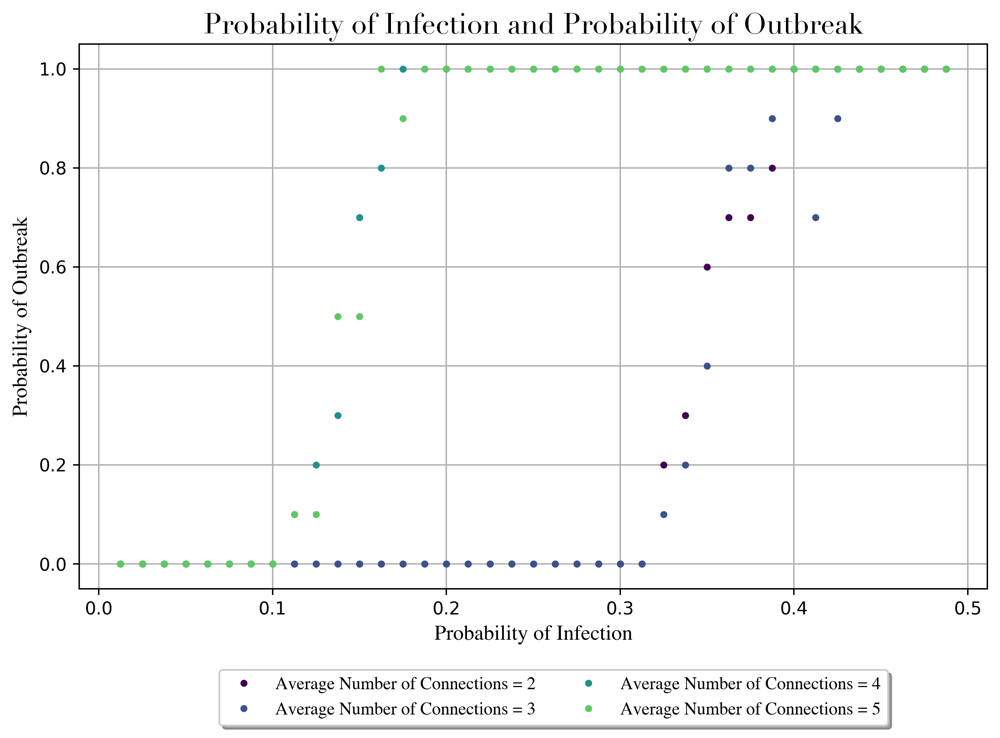

In [25]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    valid_data_p = df_p[i]
    
    plt.plot(valid_data_p['Probability of Infection'],valid_data_p['Probability of Outbreak'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Probability of Outbreak',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Probability of Infection and Probability of Outbreak', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
# plt.xscale('log')
# plt.xlim(0, 5000)
plt.grid()
plt.tight_layout()
plt.show()

## Repeat I

In [30]:
df_p_2_0 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_2_2024-03-04 12:53:51.487158.csv')
df_p_2_1 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_2_2024-03-07 14:20:02.561260.csv')
df_p_3 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_3_2024-03-04 13:29:29.427327.csv')
df_p_4_0 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_4_2024-03-04 14:08:17.123266.csv')
df_p_4_1 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_4_2024-03-08 13:56:27.242836.csv')
df_p_5 = pd.read_csv('aspl_results/prob_inf_more_repeats/aspl_prob_inf_5_2024-03-04 14:48:03.829016.csv')

df_p_2 = pd.concat([df_p_2_0, df_p_2_1, df_p_3])
df_p_4 = pd.concat([df_p_4_0, df_p_4_1, df_p_5])

df_p_2 = df_p_2.sort_values(by = 'Probability of Infection')
df_p_4 = df_p_4.sort_values(by = 'Probability of Infection')

df_p = [df_p_2, df_p_4]

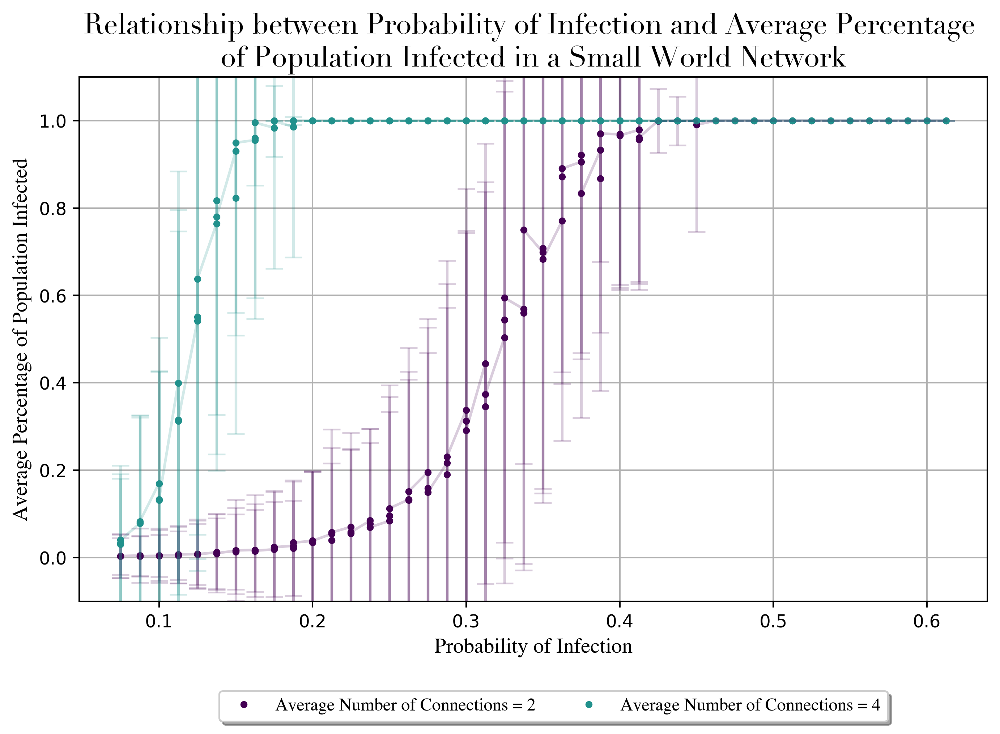

In [31]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected']), 
                 color = cm.viridis(i/len(df_p)), ls = None, alpha = 0.2, capsize = 5)


    # popt, pcov = curve_fit(sigmoid, df_p[i]['Probability of Infection'], df_p[i]['Mean Percentage of Population Infected'])
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    # xx = np.linspace(0, 1)
    # plt.plot(xx, sigmoid(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')

    # plt.fill_between(xx, sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Average Percentage of Population Infected',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Percentage \n of Population Infected in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.2),
          ncol=2, fancybox=True, shadow=True)
plt.grid()
plt.ylim(-0.1, 1.1)
# plt.yscale('log')
plt.tight_layout()
plt.show()

In [63]:
def func(x, a, b, c, d, e):
    return a*1/(b + c*np.exp(x - d)) + e

In [65]:
def sigmoid(x ,x0, k, b):
    y = -1 / (1 + np.exp(-k*(x-x0))) + b
    return (y)

Avg. N of Connections:  2
[1.         1.         1.         1.         0.43719245]
[[inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]]
Avg. N of Connections:  4
[1.        1.        1.        1.        0.8818638]
[[inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]
 [inf inf inf inf inf]]


/var/folders/dw/l8wzwkms1mjgzz83yyjnks840000gn/T/ipykernel_19337/2521495231.py:2: RuntimeWarning: overflow encountered in exp
  return a*1/(b + c*np.exp(x - d)) + e


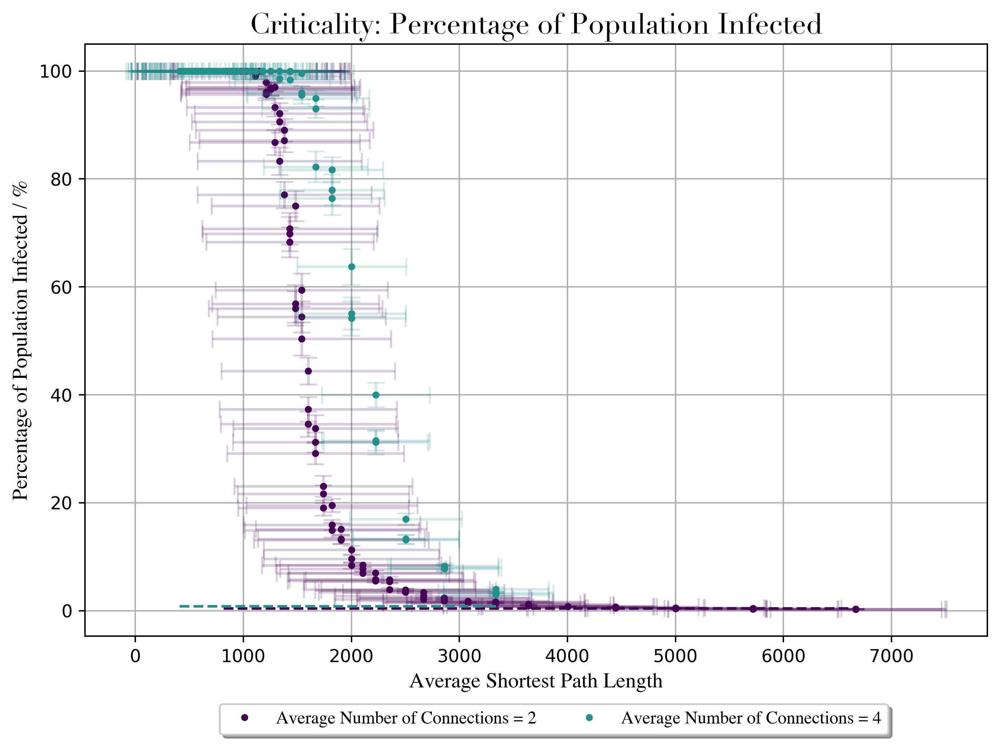

In [68]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    valid_data_p = df_p[i]

    if p_cons[i] == 2:
        xnoise = np.random.normal(800, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],100*valid_data_p['Mean Percentage of Population Infected'], xerr = xnoise, yerr = 100*np.array(valid_data_p['Std. Dev Percentage of Population Infected'])/np.sqrt(len(valid_data_p['Std. Dev Percentage of Population Infected'])), 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    else:
        xnoise = np.random.normal(500, 20, len(valid_data_p['Mean ASPL']))
        plt.errorbar(valid_data_p['Mean ASPL'],100*valid_data_p['Mean Percentage of Population Infected'], xerr = xnoise, yerr = 100*np.array(valid_data_p['Std. Dev Percentage of Population Infected'])/np.sqrt(len(valid_data_p['Std. Dev Percentage of Population Infected'])), 
                 color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.2)
    
    plt.plot(valid_data_p['Mean ASPL'], 100*valid_data_p['Mean Percentage of Population Infected'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    
    popt, pcov = curve_fit(func, valid_data_p['Mean ASPL'], valid_data_p['Mean Percentage of Population Infected'], maxfev = 10000)
    print('Avg. N of Connections: ', p_cons[i])
    print(popt)
    print(pcov)


    xx = np.linspace(min(valid_data_p['Mean ASPL']), max(valid_data_p['Mean ASPL']), 100)
    plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)
    # plt.fill_between(xx, func(xx, *[popt[i] if i == len(popt)-2 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     func(xx, *[popt[i] if i == len(popt)-2 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Percentage of Population Infected / %',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Criticality: Percentage of Population Infected', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.9, -0.14),
          ncol=2, fancybox=True, shadow=True)
# plt.xscale('log')
# plt.xlim(2e2, 1e4)
plt.grid()
plt.tight_layout()
plt.show()

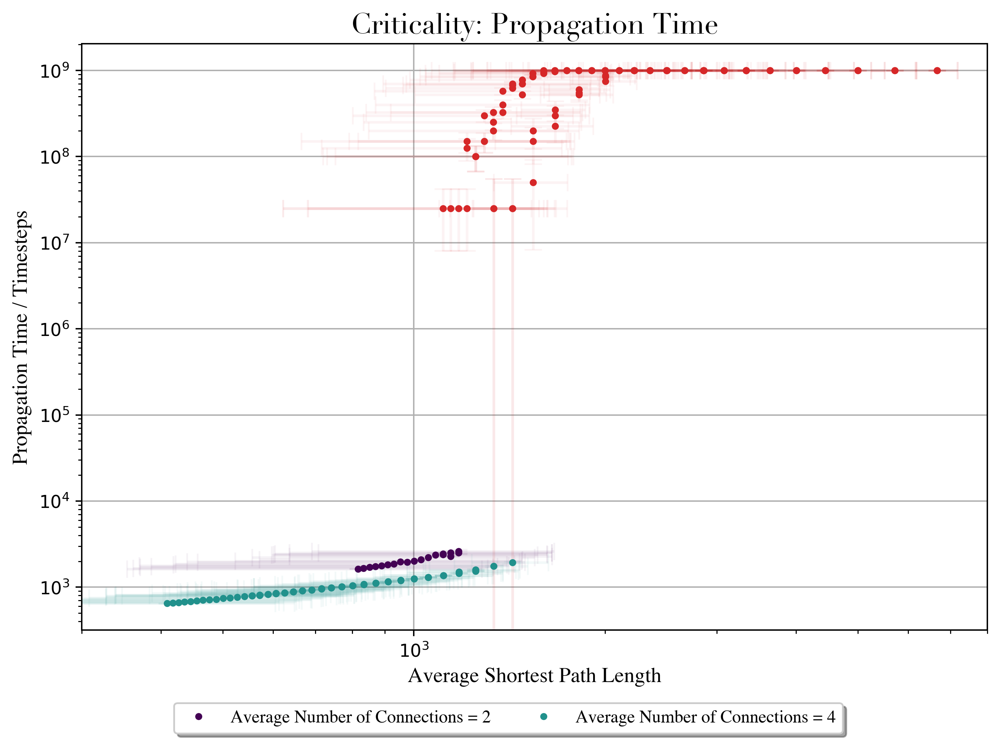

In [48]:
plt.figure(figsize=(8, 6), dpi = 350)

p_cons = [2, 4]

for i in range(len(df_p)):
    valid_data_p = df_p[i][df_p[i]['Mean Propagation Time'] < 2e4]
    contained_data = df_p[i][df_p[i]['Mean Propagation Time'] >= 2e4]
    
    if p_cons[i] == 2:
        xnoise_o = np.random.normal(500, 20, len(valid_data_p['Mean ASPL']))
        xnoise_c = np.random.normal(500, 20, len(contained_data['Mean ASPL']))
    else:
        xnoise_o = np.random.normal(200, 20, len(valid_data_p['Mean ASPL']))
        xnoise_c = np.random.normal(200, 20, len(contained_data['Mean ASPL']))

    plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Mean Propagation Time'],yerr = np.array(valid_data_p['Std. Dev. Propagation Time'])/np.sqrt(len(valid_data_p['Std. Dev. Propagation Time'])),
                    xerr = xnoise_o, color = cm.viridis(i/len(df_p)), linestyle = '', capsize = 5, alpha = 0.05)
    plt.errorbar(contained_data['Mean ASPL'],contained_data['Mean Propagation Time'], xerr = xnoise_c, yerr = np.array(contained_data['Std. Dev. Propagation Time'])/np.sqrt(len(contained_data['Std. Dev. Propagation Time'])),
                    color = 'tab:red', linestyle = '', capsize = 5, alpha = 0.05)
    plt.plot(valid_data_p['Mean ASPL'], valid_data_p['Mean Propagation Time'], '.',color = cm.viridis(i/len(df_p)), 
                label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.plot(contained_data['Mean ASPL'], contained_data['Mean Propagation Time'], '.',color = 'tab:red')

        

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Propagation Time / Timesteps',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Criticality: Propagation Time', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.85, -0.15),
          ncol=2, fancybox=True, shadow=True)
plt.yscale('log')
plt.xlim(3e2, 8e3)
plt.xscale('log')
plt.grid()
plt.tight_layout()
plt.show()

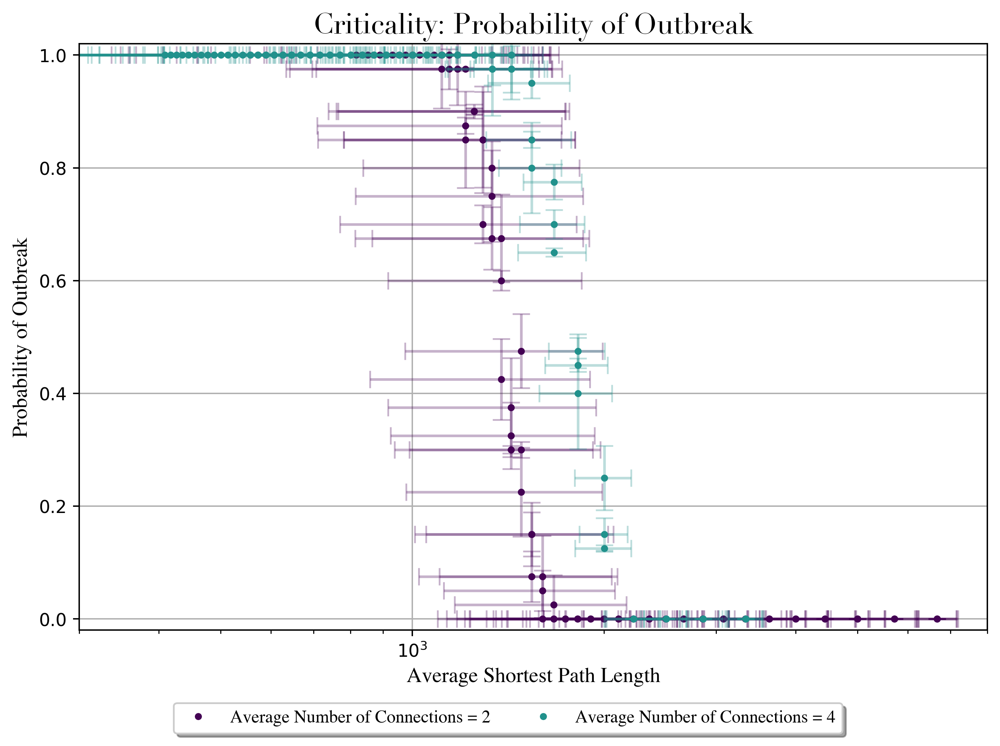

In [46]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    valid_data_p = df_p[i]
    prob_error = [0 if v == 1 or v == 0 else random.uniform(0,0.1) for v in valid_data_p['Probability of Outbreak']]
    
    plt.plot(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    if p_cons[i] == 2:
        xnoise_o = np.random.normal(500, 20, len(valid_data_p['Mean ASPL']))
    else:
        xnoise_o = np.random.normal(200, 20, len(valid_data_p['Mean ASPL']))

    plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], xerr = xnoise_o, yerr = prob_error,
                     color = cm.viridis(i/len(df_p)), ls = '', capsize = 5, alpha = 0.3)
    
# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Probability of Outbreak',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Criticality: Probability of Outbreak', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.xscale('log')
plt.xlim(3e2, 8e3)
plt.ylim(-0.02, 1.02)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.85, -0.15),
          ncol=2, fancybox=True, shadow=True)
plt.grid()
plt.tight_layout()
plt.show()

## Repeat II

In [21]:
df_p_2 = pd.read_csv('prob_inf_more_repeats/aspl_prob_inf_2_2024-03-12.csv')
df_p_4 = pd.read_csv('prob_inf_more_repeats/aspl_prob_inf_4_2024-03-12.csv')
df_p_6 = pd.read_csv('prob_inf_more_repeats/aspl_prob_inf_6_2024-03-12.csv')

df_p = [df_p_2, df_p_4, df_p_6]

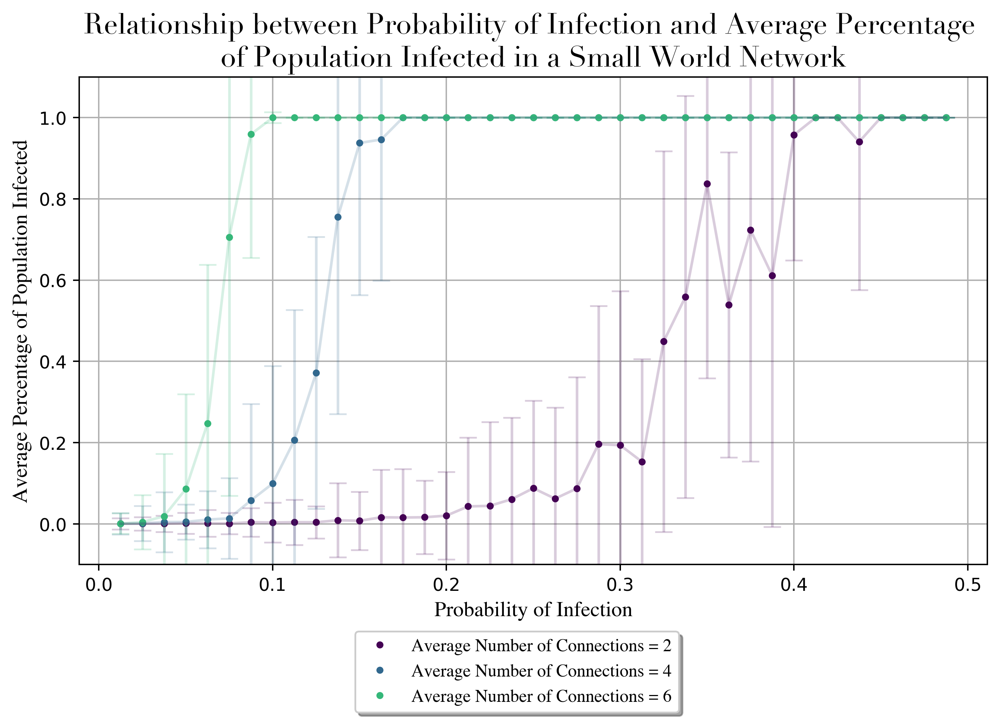

In [30]:
p_cons = [2, 4, 6]

plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    plt.plot(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], '.', color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    plt.errorbar(df_p[i]['Probability of Infection'],df_p[i]['Mean Percentage of Population Infected'], np.sqrt(df_p[i]['Std. Dev Percentage of Population Infected']), 
                 color = cm.viridis(i/len(df_p)), ls = None, alpha = 0.2, capsize = 5)


    # popt, pcov = curve_fit(sigmoid, df_p[i]['Probability of Infection'], df_p[i]['Mean Percentage of Population Infected'])
    # print('Avg. N of Connections: ', p_cons[i])
    # print(popt)
    # print(pcov)

    # xx = np.linspace(0, 1)
    # plt.plot(xx, sigmoid(xx, *popt), color = cm.viridis(i/len(df_p)), ls = '--')

    # plt.fill_between(xx, sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                     sigmoid(xx, *[popt[i] if i != len(popt)-1 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_p)), alpha = 0.2)


plt.xlabel('Probability of Infection', fontsize = 12, **hfont)
plt.ylabel('Average Percentage of Population Infected',fontsize = 12,  **hfont)
plt.title('Relationship between Probability of Infection and Average Percentage \n of Population Infected in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.67, -0.22),
          ncol=1, fancybox=True, shadow=True)
plt.grid()
plt.ylim(-0.1, 1.1)
# plt.yscale('log')
plt.tight_layout()
plt.show()

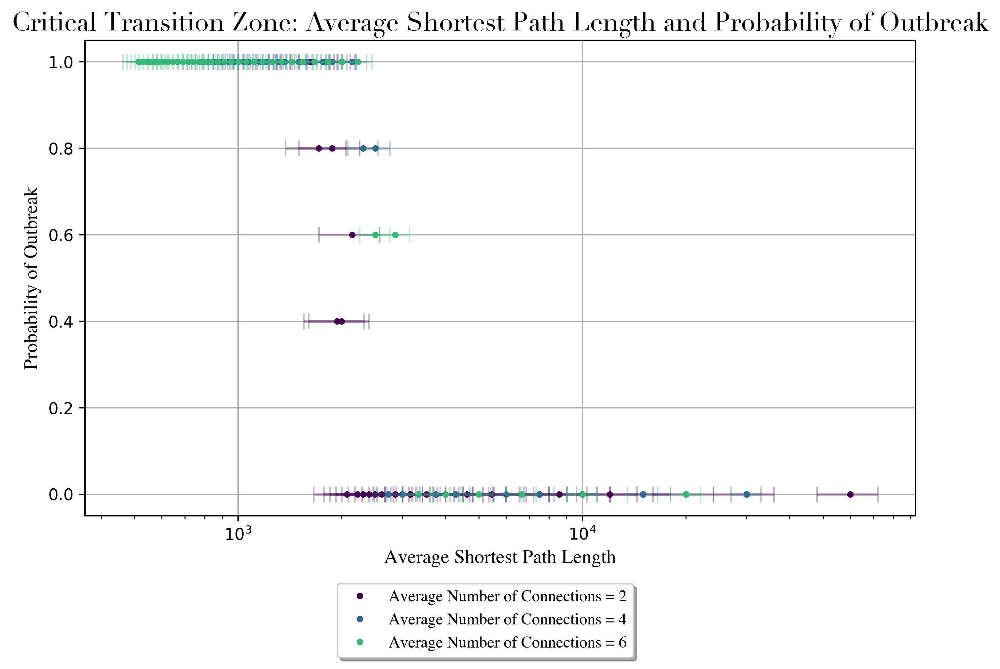

In [31]:
plt.figure(figsize=(8, 6), dpi = 350)

for i in range(len(df_p)):
    valid_data_p = df_p[i]
    
    plt.plot(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], '.',color = cm.viridis(i/len(df_p)), 
             label = 'Average Number of Connections = {}'.format(p_cons[i]))
    if p_cons[i] == 2:
        plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], xerr = [0.2*i for i in valid_data_p['Mean ASPL']], 
                     color = cm.viridis(i/len(df_p)), ls = '', capsize = 5, alpha = 0.3)
    else:
        plt.errorbar(valid_data_p['Mean ASPL'],valid_data_p['Probability of Outbreak'], xerr = [0.1*i for i in valid_data_p['Mean ASPL']], 
                     color = cm.viridis(i/len(df_p)), ls = '', capsize = 5, alpha = 0.3)
    
# plt.axvline(x = 1250, color = 'tab:red', alpha = 0.4, ls = '--', label = 'Critical ASPL') # 2
# plt.axvspan(1250, 2503.751875937969, alpha=0.1, color='red')

plt.xlabel('Average Shortest Path Length', fontsize = 12, **hfont)
plt.ylabel('Probability of Outbreak',fontsize = 12,  **hfont)
# plt.ylim(0, 6000)
plt.title('Critical Transition Zone: Average Shortest Path Length and Probability of Outbreak', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.xscale('log')
# plt.xlim(0, 5000)
plt.legend(prop = font, loc='center right', bbox_to_anchor=(0.67, -0.22),
          ncol=1, fancybox=True, shadow=True)
plt.grid()
plt.tight_layout()
plt.show()

# Small World: Average Number of Connections

In [5]:
df_c_5 = pd.read_csv('aspl_sw_conn_500_2024-02-29 12:39:43.315857.csv') # nodes = 500
df_c_10 = pd.read_csv('aspl_sw_conn_1000_2024-02-28 21:38:25.862139.csv') # nodes = 1000
df_c_20 = pd.read_csv('aspl_sw_conn_2000_2024-02-28 21:38:25.862139.csv') # nodes = 2000
df_c_5 = df_c_5.drop(['Unnamed: 0'], axis = 1)
df_c_10 = df_c_10.drop(['Unnamed: 0'], axis = 1)
df_c_20 = df_c_20.drop(['Unnamed: 0'], axis = 1)

df_c = [df_c_5, df_c_10, df_c_20]

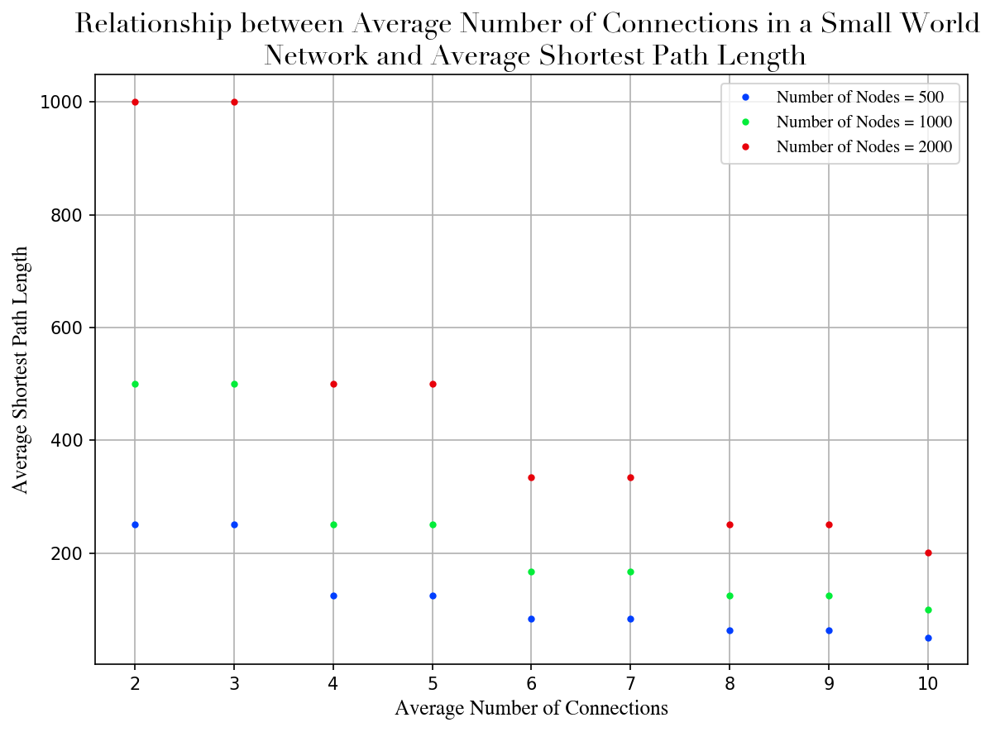

In [6]:
plt.figure(figsize=(8, 6), dpi = 350)

n_nodes = [500, 1000, 2000]
for i in range(len(df_c)):
    plt.plot(df_c[i]['Number of Connections'], df_c[i]['Mean ASPL'], '.', label = 'Number of Nodes = {}'.format(n_nodes[i]))

plt.xlabel('Average Number of Connections', fontsize = 12, **hfont)
plt.ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
plt.title('Relationship between Average Number of Connections in a Small World \n Network and Average Shortest Path Length', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()


### Compute differences between the values, as you increase the average number of connections

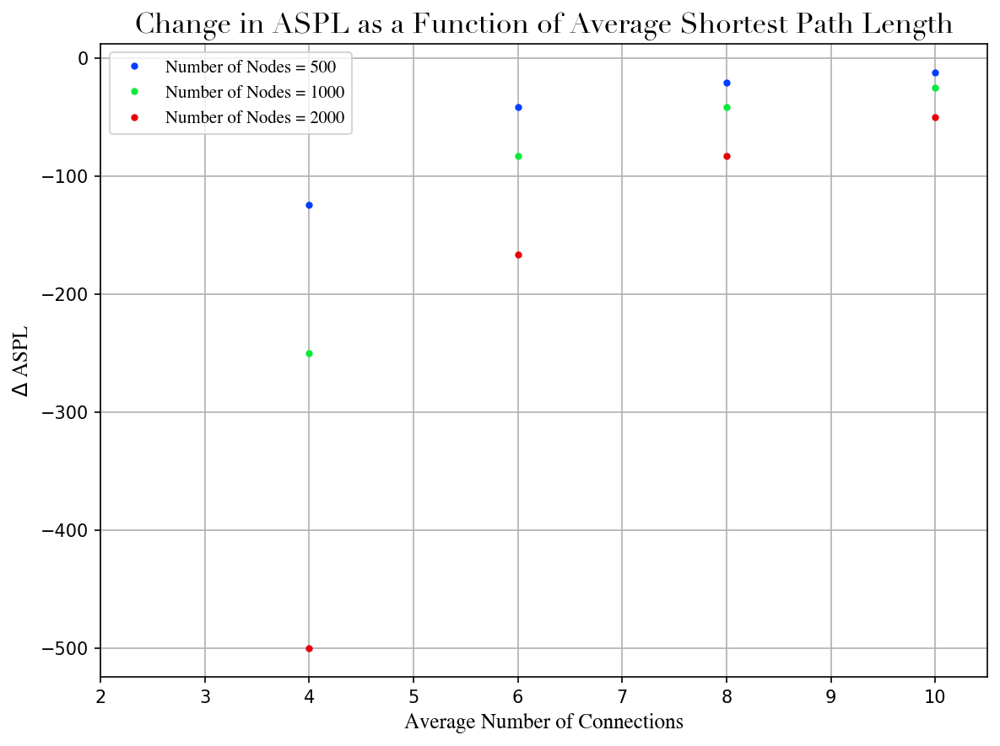

In [7]:
changes = []

plt.figure(figsize=(8, 6), dpi = 150)

for i in range(len(df_c)):
    change = [(df_c[i]['Mean ASPL'][ind] - df_c[i]['Mean ASPL'][ind - 1]) if (df_c[i]['Mean ASPL'][ind] - df_c[i]['Mean ASPL'][ind - 1]) != 0 else None for ind in range(1, len(df_c[i]['Mean ASPL']))]
    changes.append(change)
    plt.plot(df_c[i]['Number of Connections'][1:], change, '.', label = 'Number of Nodes = {}'.format(n_nodes[i]))


plt.xlabel('Average Number of Connections', fontsize = 12, **hfont)
plt.ylabel('$\Delta$ ASPL',fontsize = 12,  **hfont)
plt.title('Change in ASPL as a Function of Average Shortest Path Length', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.xlim(2, 10.5)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()

### Attempt to fit exponential curve to data

In [9]:
def func(x, a, b, c):
    return a * np.exp(-b * x) + c

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


For n = 500 [4.47866524e+02 3.19027657e-01 3.12542647e+01] [[8.73512438e+03 9.70437504e+00 1.85999531e+03]
 [9.70437504e+00 1.59415328e-02 3.99707348e+00]
 [1.85999531e+03 3.99707348e+00 1.18749167e+03]]
For n = 1000 [8.96641884e+02 3.19031044e-01 6.15663812e+01] [[3.49918102e+04 1.94199453e+01 7.45407985e+03]
 [1.94199453e+01 1.59395075e-02 8.00401017e+00]
 [7.45407985e+03 8.00401017e+00 4.76199897e+03]]
For n = 2000 [1.79416890e+03 3.19025025e-01 1.22185445e+02] [[1.40170921e+05 3.88730207e+01 2.98490174e+04]
 [3.88730207e+01 1.59410030e-02 1.60128343e+01]
 [2.98490174e+04 1.60128343e+01 1.90586794e+04]]
B: 0.31902790847827117 3.017333203442516e-06


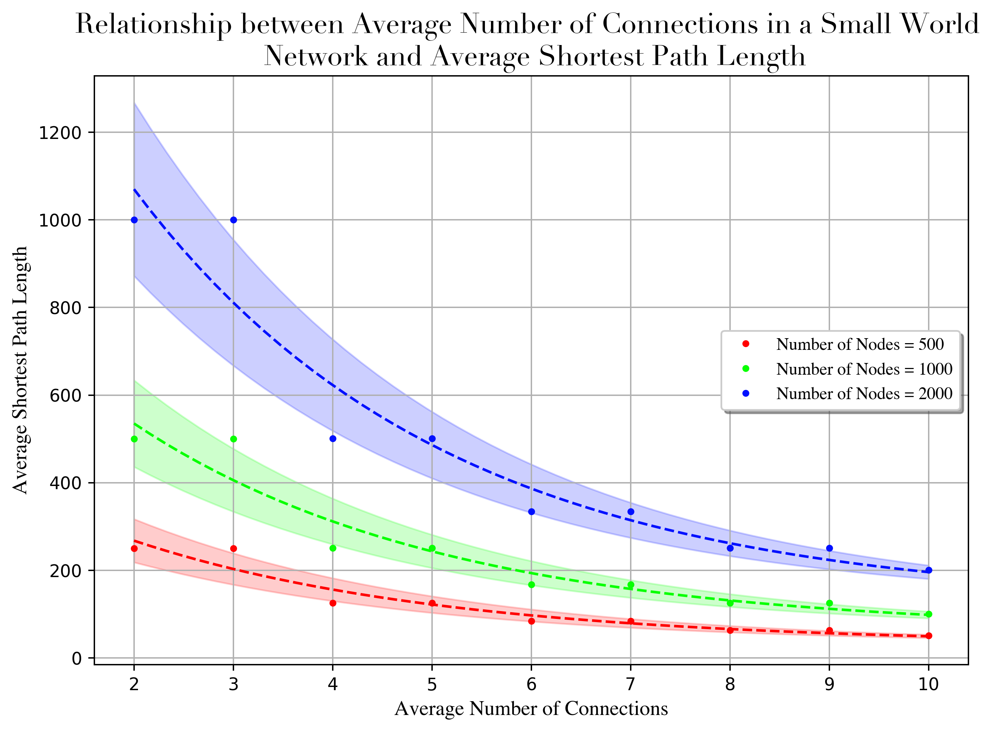

In [9]:
plt.figure(figsize=(8, 6), dpi = 350)

n_nodes = [500, 1000, 2000, 4000]

B = []

for i in range(len(df_c)):
    plt.plot(df_c[i]['Number of Connections'], df_c[i]['Mean ASPL'], '.',color = cm.hsv(i/len(df_c)), label = 'Number of Nodes = {}'.format(n_nodes[i]))
    popt, pcov = curve_fit(func, df_c[i]['Number of Connections'], df_c[i]['Mean ASPL'])
    print('For n = {}'.format(n_nodes[i]), popt, pcov)

    B.append(popt[1])

    xx = np.linspace(min(df_c[i]['Number of Connections']), max(df_c[i]['Number of Connections']))
    plt.plot(xx, func(xx, *popt), color = cm.hsv(i/len(df_c)), ls = '--')
    plt.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                     func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.hsv(i/len(df_c)), alpha = 0.2)

print('B:', statistics.mean(B), statistics.stdev(B))


plt.xlabel('Average Number of Connections', fontsize = 12, **hfont)
plt.ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
plt.title('Relationship between Average Number of Connections in a Small World \n Network and Average Shortest Path Length', fontsize = 16, **csfont)
plt.legend(prop = font, loc='center right', 
          ncol=1, fancybox=True, shadow=True)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()


### Propagation Time

For n = 500 [1.17271677e+03 4.02006793e-01 3.02205988e+01] [[1.19970865e+05 4.78688240e+01 1.34223116e+04]
 [4.78688240e+01 2.39176502e-02 8.47151694e+00]
 [1.34223116e+04 8.47151694e+00 3.97322010e+03]]
For n = 1000 [2.28866455e+03 3.77826401e-01 4.11441385e+01] [[5.74917146e+05 1.19236879e+02 7.70439738e+04]
 [1.19236879e+02 3.19628471e-02 2.62446995e+01]
 [7.70439738e+04 2.62446995e+01 2.75577197e+04]]
For n = 2000 [4.53501167e+03 3.77452443e-01 8.42649639e+01] [[2.17760260e+06 2.27978775e+02 2.92648084e+05]
 [2.27978775e+02 3.08661327e-02 5.03557171e+01]
 [2.92648084e+05 5.03557171e+01 1.05001038e+05]]
B: 0.3857618788815287 0.014069750552156104


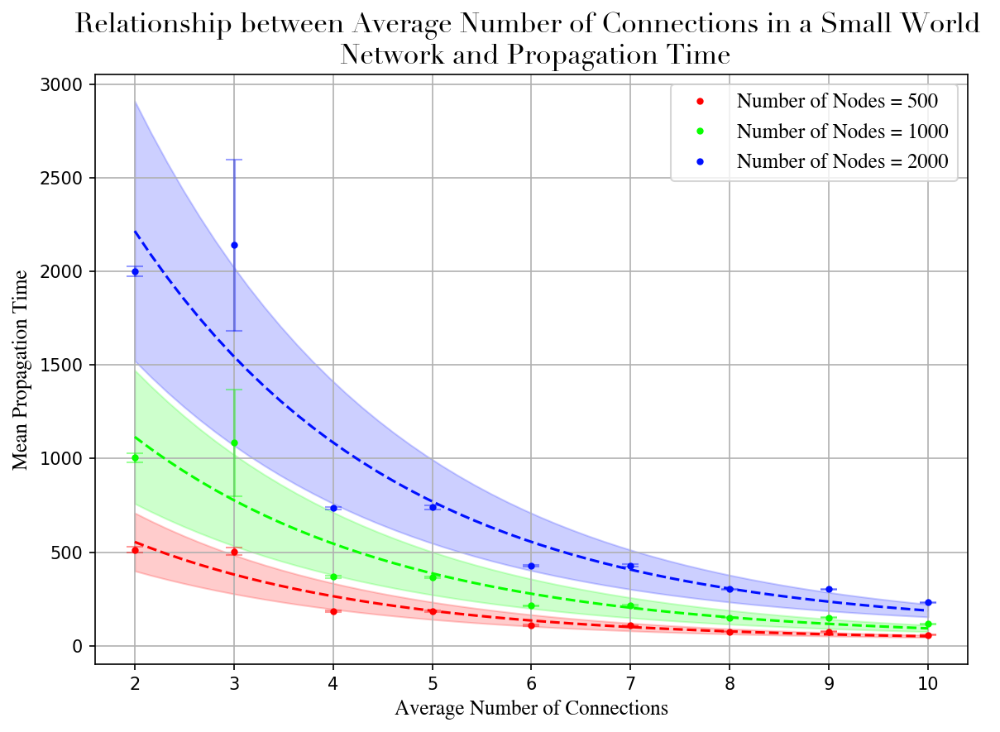

In [8]:
plt.figure(figsize=(8, 6), dpi = 150)

n_nodes = [500, 1000, 2000]
B = []
for i in range(len(df_c)):
    plt.plot(df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], '.',color = cm.hsv(i/len(df_c)), label = 'Number of Nodes = {}'.format(n_nodes[i]))
    plt.errorbar(df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], yerr = df_c[i]['Std. Dev. Propagation Time'],
                 color = cm.hsv(i/len(df_c)), capsize = 5, ls = '', alpha = 0.4)

    popt, pcov = curve_fit(func, df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], maxfev = 10000)
    B.append(popt[1])
    print('For n = {}'.format(n_nodes[i]), popt, pcov)
    xx = np.linspace(min(df_c[i]['Number of Connections']), max(df_c[i]['Number of Connections']))
    plt.plot(xx, func(xx, *popt), color = cm.hsv(i/len(df_c)), ls = '--')
    plt.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                     func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.hsv(i/len(df_c)), alpha = 0.2)

print('B:', statistics.mean(B), statistics.stdev(B))
plt.xlabel('Average Number of Connections', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time',fontsize = 12,  **hfont)
plt.title('Relationship between Average Number of Connections in a Small World \n Network and Propagation Time', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


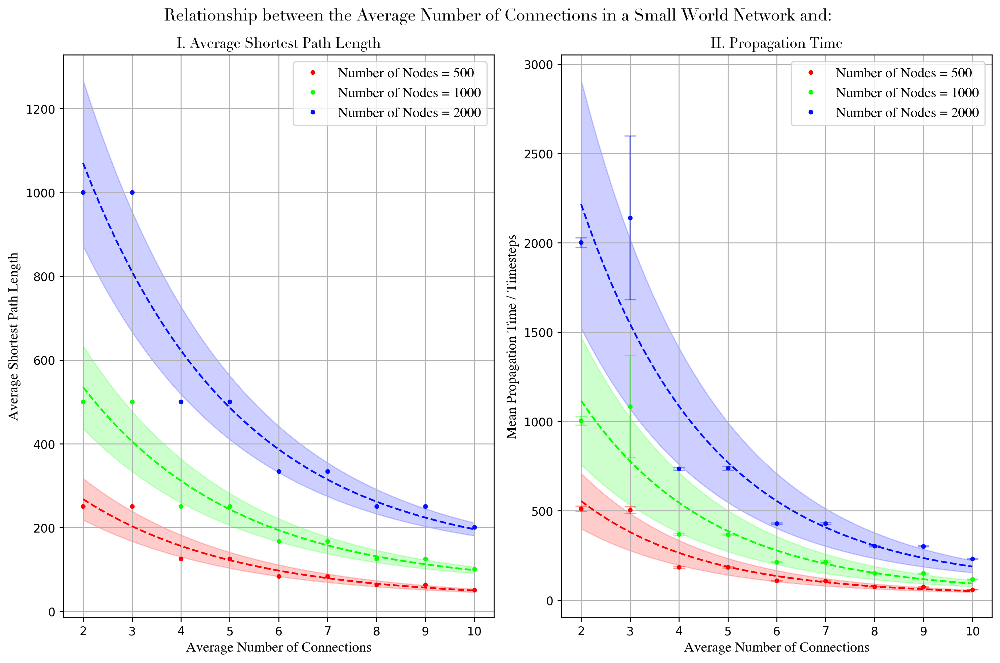

In [77]:
# Subplots

fig, (ax1, ax2) = plt.subplots(1, 2, sharex = True, figsize = (12, 8), dpi = 250)

n_nodes = [500, 1000, 2000]

B = []

for i in range(len(df_c)):
    ax1.plot(df_c[i]['Number of Connections'], df_c[i]['Mean ASPL'], '.',color = cm.hsv(i/len(df_c)), label = 'Number of Nodes = {}'.format(n_nodes[i]))
    popt, pcov = curve_fit(func, df_c[i]['Number of Connections'], df_c[i]['Mean ASPL'])
    # print('For n = {}'.format(n_nodes[i]), popt, pcov)

    B.append(popt[1])

    xx = np.linspace(min(df_c[i]['Number of Connections']), max(df_c[i]['Number of Connections']))
    ax1.plot(xx, func(xx, *popt), color = cm.hsv(i/len(df_c)), ls = '--')
    ax1.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                     func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.hsv(i/len(df_c)), alpha = 0.2)

# print('B:', statistics.mean(B), statistics.stdev(B))

ax1.set_xlabel('Average Number of Connections', fontsize = 12, **hfont)
ax1.set_ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
ax1.set_title('I. Average Shortest Path Length', fontsize = 12, **csfont)
ax1.grid()
ax1.legend(prop = font)
# ax1.grid()
# plt.yscale('log')

for i in range(len(df_c)):
    ax2.plot(df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], '.',color = cm.hsv(i/len(df_c)), label = 'Number of Nodes = {}'.format(n_nodes[i]))
    ax2.errorbar(df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], yerr = df_c[i]['Std. Dev. Propagation Time'],
                 color = cm.hsv(i/len(df_c)), capsize = 5, ls = '', alpha = 0.4)

    popt, pcov = curve_fit(func, df_c[i]['Number of Connections'], df_c[i]['Mean Propagation Time'], maxfev = 10000)
    B.append(popt[1])
    # print('For n = {}'.format(n_nodes[i]), popt, pcov)
    xx = np.linspace(min(df_c[i]['Number of Connections']), max(df_c[i]['Number of Connections']))
    ax2.plot(xx, func(xx, *popt), color = cm.hsv(i/len(df_c)), ls = '--')
    ax2.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
                     func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.hsv(i/len(df_c)), alpha = 0.2)

# print('B:', statistics.mean(B), statistics.stdev(B))
ax2.set_xlabel('Average Number of Connections', fontsize = 12, **hfont)
ax2.set_ylabel('Mean Propagation Time / Timesteps',fontsize = 12,  **hfont)
ax2.set_title('II. Propagation Time', fontsize = 12, **csfont)
ax2.legend(prop = font)
ax2.grid()
# plt.yscale('log')

fig.suptitle('Relationship between the Average Number of Connections in a Small World Network and: ', fontsize = 14, **csfont)
plt.tight_layout()
plt.show()


### Propagation Time and ASPL

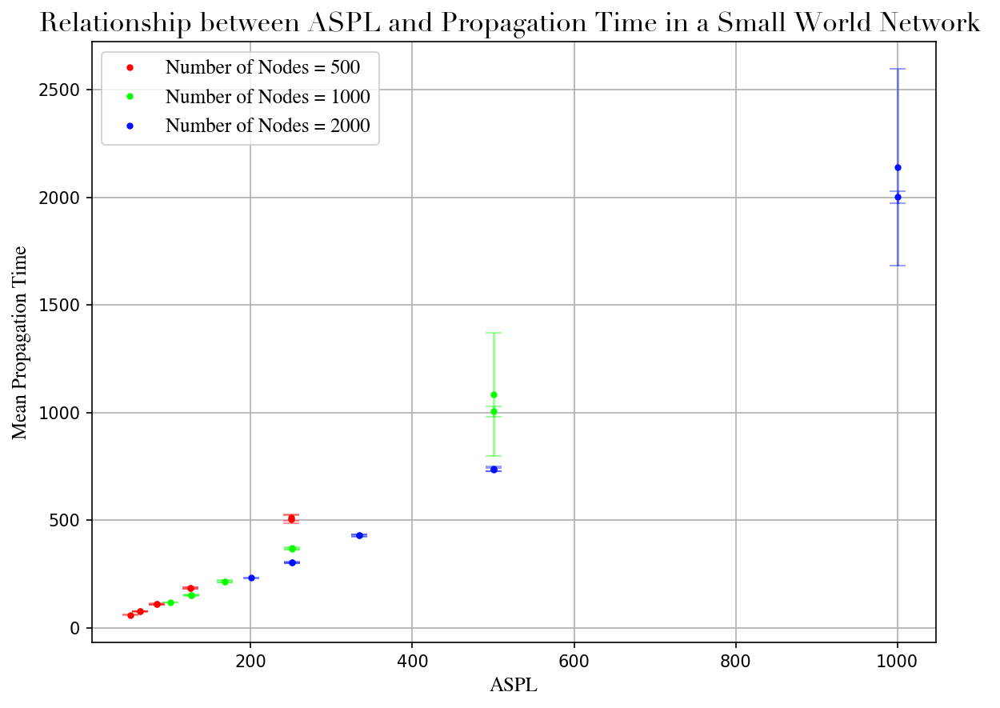

In [229]:
plt.figure(figsize=(8, 6), dpi = 150)

n_nodes = [500, 1000, 2000]
B = []
for i in range(len(df_c)):
    plt.plot(df_c[i]['Mean ASPL'], df_c[i]['Mean Propagation Time'], '.',color = cm.hsv(i/len(df_c)), label = 'Number of Nodes = {}'.format(n_nodes[i]))
    plt.errorbar(df_c[i]['Mean ASPL'], df_c[i]['Mean Propagation Time'], yerr = df_c[i]['Std. Dev. Propagation Time'],
                 color = cm.hsv(i/len(df_c)), capsize = 5, ls = '', alpha = 0.4)

    # print('For n = {}'.format(n_nodes[i]), popt, pcov)
    # xx = np.linspace(min(df_c[i]['Number of Connections']), max(df_c[i]['Number of Connections']))
    # plt.plot(xx, func(xx, *popt), color = cm.hsv(i/len(df_c)), ls = '--')
    # plt.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                  func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.hsv(i/len(df_c)), alpha = 0.2)

# print('B:', statistics.mean(B), statistics.stdev(B))
plt.xlabel('ASPL', fontsize = 12, **hfont)
plt.ylabel('Mean Propagation Time',fontsize = 12,  **hfont)
plt.title('Relationship between ASPL and Propagation Time in a Small World Network ', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
# plt.yscale('log')
plt.tight_layout()
plt.show()

## New Data

In [173]:
df_c_500 = pd.read_csv('nodes_con_aspl_500_2024-03-14 11:56:07.136482.csv')
df_c_1000 = pd.read_csv('nodes_con_aspl_1000_2024-03-14 12:01:38.210540.csv')
df_c_2000 = pd.read_csv('nodes_con_aspl_2000_2024-03-14 12:24:22.159228.csv')
df_c_4000 = pd.read_csv('nodes_con_aspl_4000_2024-03-14 13:54:43.484351.csv')

df_c = [df_c_1000, df_c_2000, df_c_4000]

In [212]:
def func(x, a, b, c, d):
    return a * np.exp(-b * (x-d)) + c

In [206]:
def func(x, a, c):
    return (a/x)+c

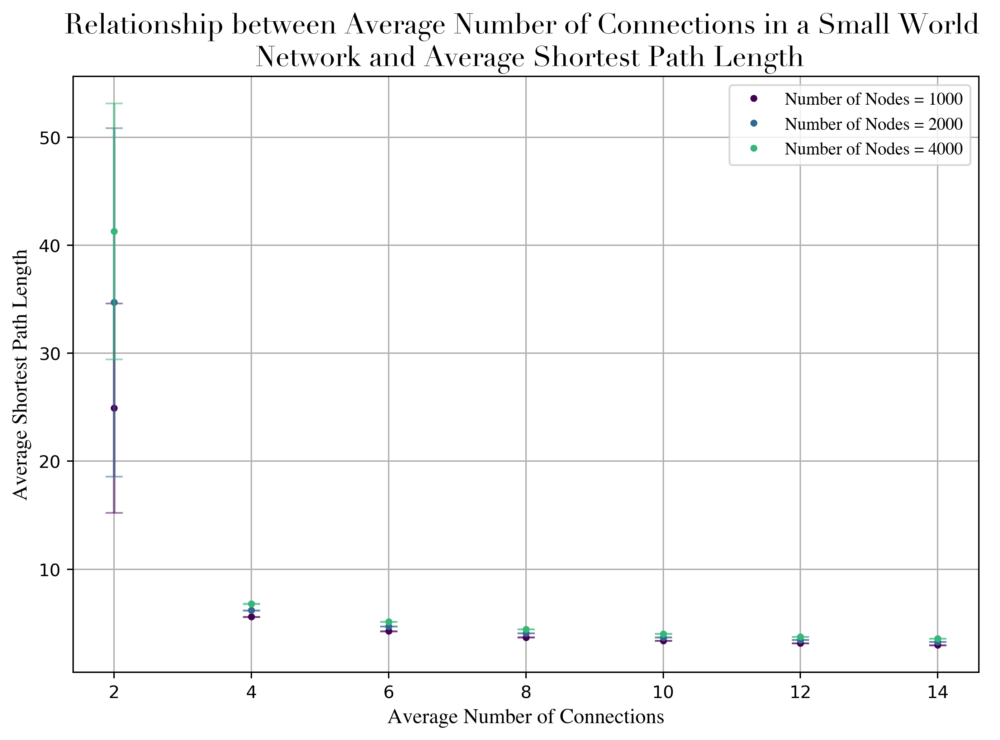

In [219]:
plt.figure(figsize=(8, 6), dpi = 350)

yval = [12, 17, 20]
yerr = [3, 1, 1]
n_nodes = [1000, 2000, 4000]
for i in range(len(df_c)):
    #xvals = [2,3,4,6,8,10]
    #yvals = [df_c[i]['Mean ASPL'][j] if j != 1 else yval[i] for j in range(len(xvals))]
    #yerrs = np.array([df_c[i]['Std. Dev ASPL'][j] if j != 1 else yerr[i] for j in range(len(xvals))])
    plt.plot(df_c[i]['Average Number of Connections'], df_c[i]['Mean ASPL'], '.', label = 'Number of Nodes = {}'.format(n_nodes[i]), color = cm.viridis(i/len(df_c)))
    plt.errorbar(df_c[i]['Average Number of Connections'], df_c[i]['Mean ASPL'],  yerr = df_c[i]['Std. Dev ASPL'], color = cm.viridis(i/len(df_c)), ls = '', capsize = 5, alpha = 0.5)
    
    popt, pcov = curve_fit(func, xvals, yvals, maxfev = 10000)
    #popt, pcov = curve_fit(func,df_c[i]['Average Number of Connections'], df_c[i]['Mean ASPL'], sigma =np.sqrt(np.sqrt(df_c[i]['Std. Dev ASPL'])),maxfev = 10000)
    
    
    # print('For n = {}'.format(n_nodes[i]), popt, pcov)
    xx = np.linspace(min(df_c[i]['Average Number of Connections']), max(df_c[i]['Average Number of Connections']))
    #plt.plot(xx, func(xx, *popt), color = cm.viridis(i/len(df_c)), ls = '--')
    #plt.fill_between(xx, func(xx, *[popt[i] if i != len(popt)-3 else popt[i] + np.sqrt(pcov[i][i]) for i in range(len(popt))]), 
    #                  func(xx, *[popt[i] if i != len(popt)-3 else popt[i] - np.sqrt(pcov[i][i]) for i in range(len(popt))]), color = cm.viridis(i/len(df_c)), alpha = 0.2)
    
    
plt.xlabel('Average Number of Connections', fontsize = 12, **hfont)
plt.ylabel('Average Shortest Path Length',fontsize = 12,  **hfont)
plt.title('Relationship between Average Number of Connections in a Small World \n Network and Average Shortest Path Length', fontsize = 16, **csfont)
plt.legend(prop = font)
plt.grid()
#plt.yscale('log')
plt.tight_layout()
plt.show()

# ASPL Variability

In [24]:
df_c_0 = pd.read_csv('aspl_variability_0.csv') # nodes = 500
df_c_1 = pd.read_csv('aspl_variability_1.csv') # nodes = 1000

df_c_0 = df_c_0.drop(['Unnamed: 0'], axis = 1)
df_c_1 = df_c_1.drop(['Unnamed: 0'], axis = 1)

frames = [df_c_0, df_c_1]

df_v = pd.concat(frames)

df_v

,Number of Nodes,Average Number of Connections,Small World Randomness,Mean ASPL,Std. Dev ASPL
0,200,2,0.2,16.142962,6.512133
1,400,2,0.2,25.010750,9.824126
2,600,2,0.2,27.848170,11.024514
3,800,2,0.2,23.943618,5.090651
4,1000,2,0.2,28.952127,8.153454
...,...,...,...,...,...
79,600,8,0.8,3.327444,0.002702
80,800,8,0.8,3.466520,0.002932
81,1000,8,0.8,3.575141,0.003128
82,1400,8,0.8,3.740899,0.002000


## Parameters varied: number of nodes, average number of connections, small world randomness

In [25]:
# Tested parameter values

con_vals = list(df_v['Average Number of Connections'].drop_duplicates().sort_values())
r_vals = list(df_v['Small World Randomness'].drop_duplicates().sort_values())
nodes_vals = list(df_v['Number of Nodes'].drop_duplicates().sort_values())

/var/folders/dw/l8wzwkms1mjgzz83yyjnks840000gn/T/ipykernel_35560/1770562992.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_data_p['Mean ASPL'] = valid_data_p['Mean ASPL']*100
/var/folders/dw/l8wzwkms1mjgzz83yyjnks840000gn/T/ipykernel_35560/1770562992.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_data_p['Std. Dev ASPL'] = valid_data_p['Std. Dev ASPL'] * 100


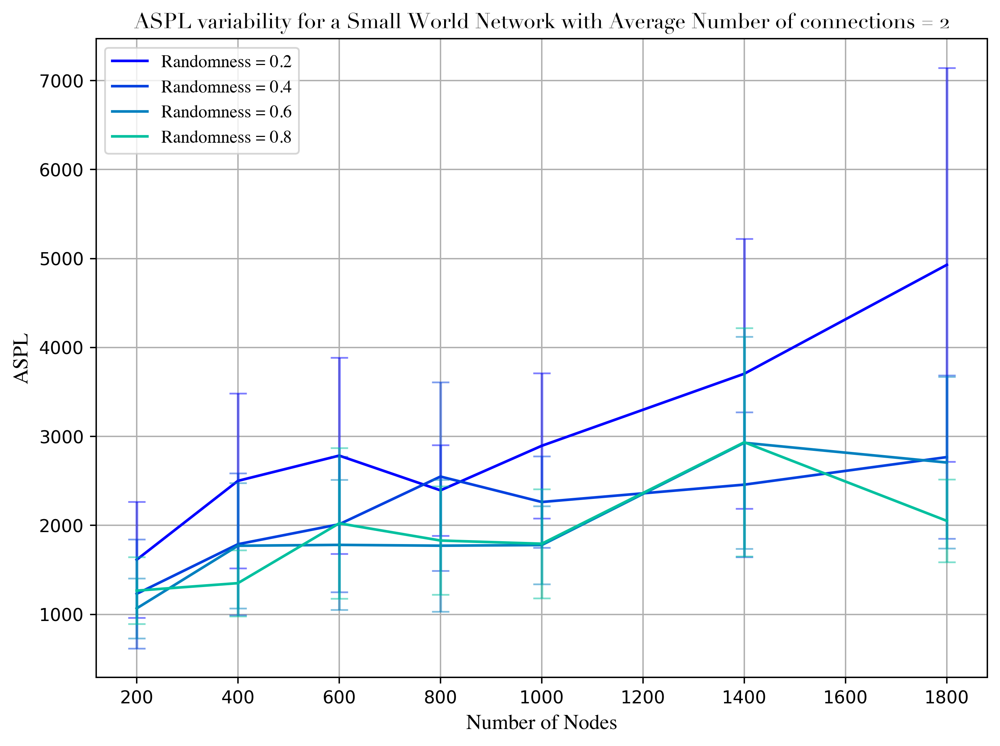

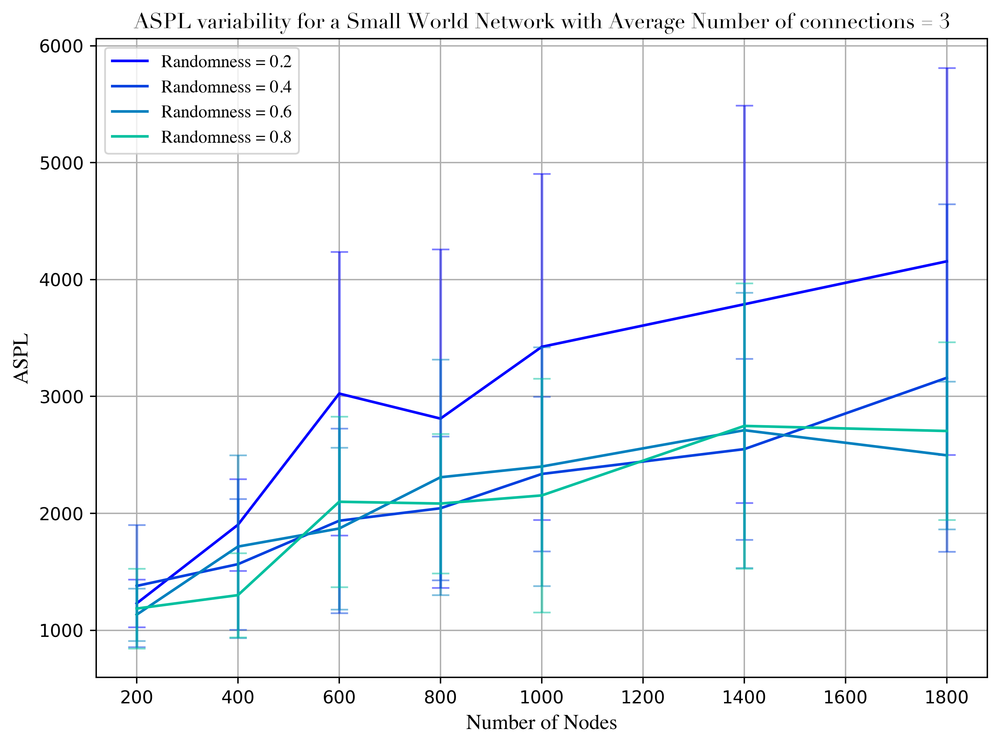

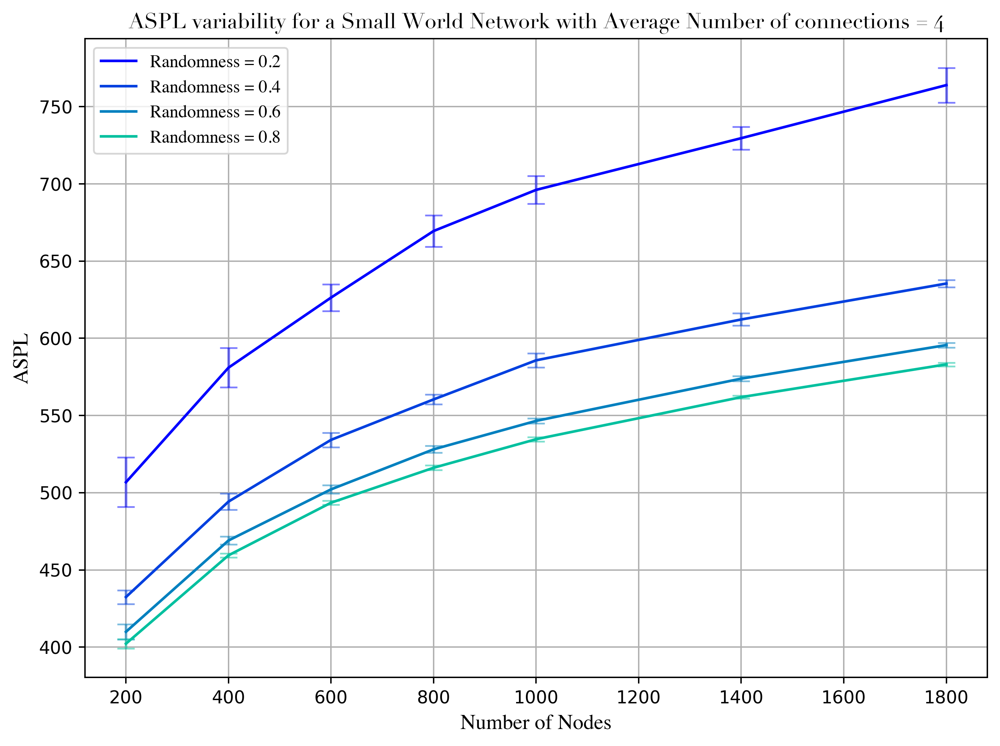

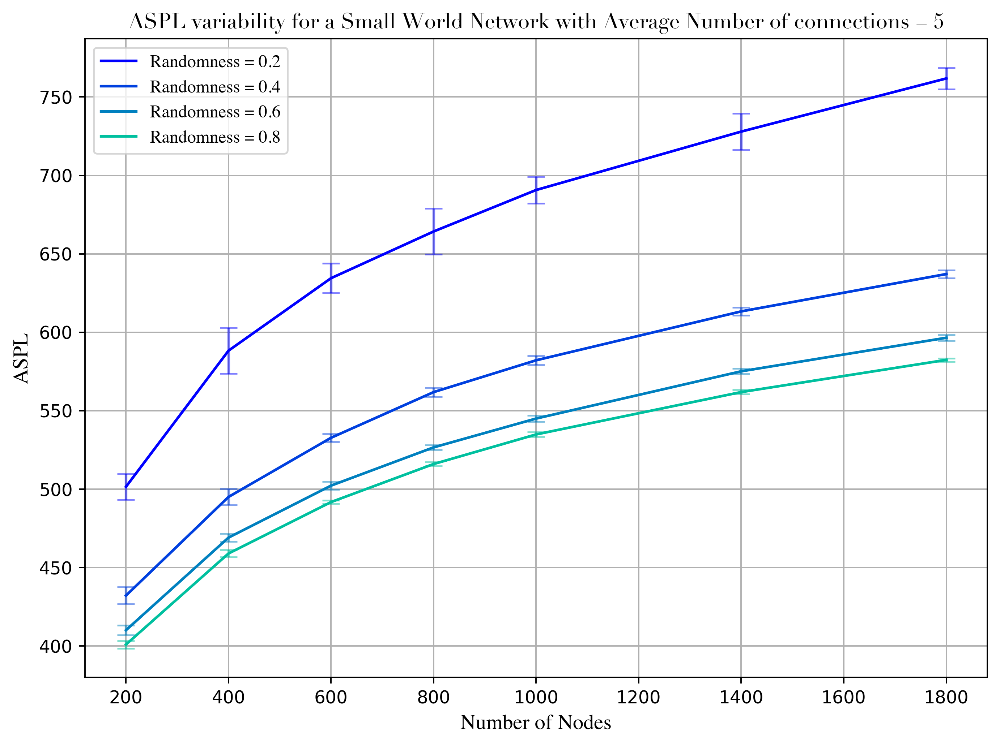

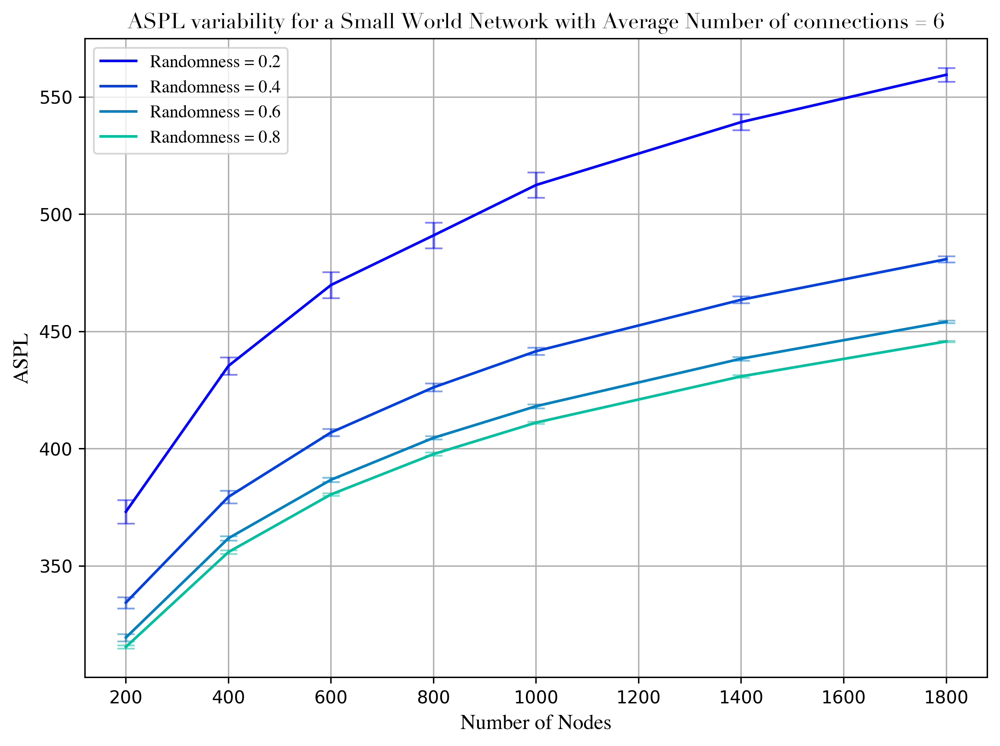

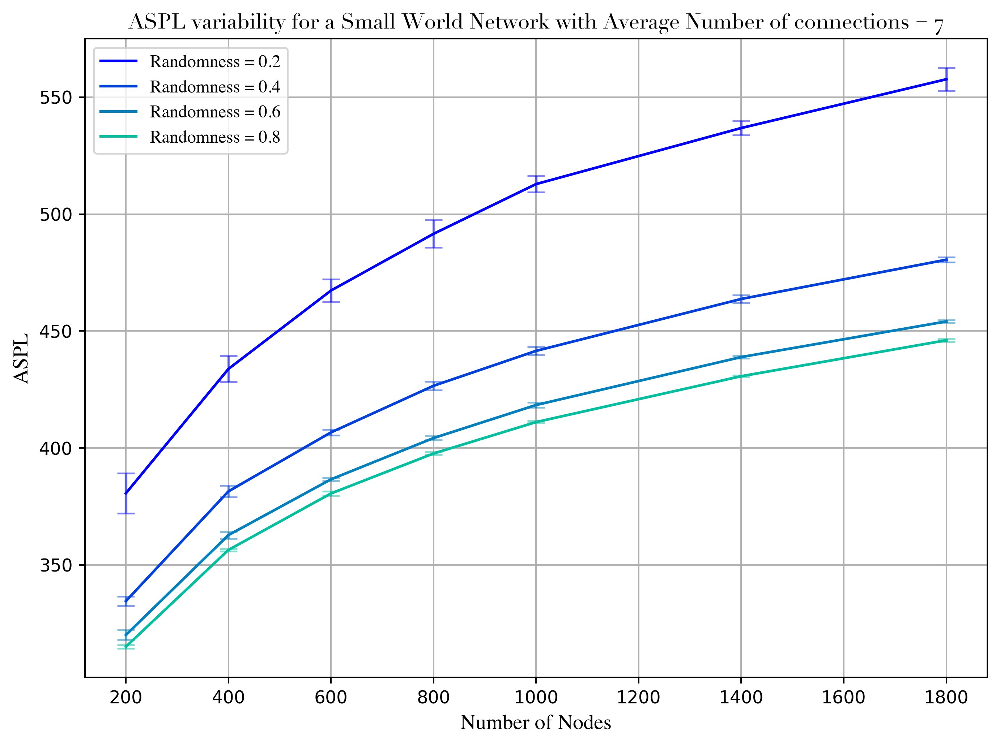

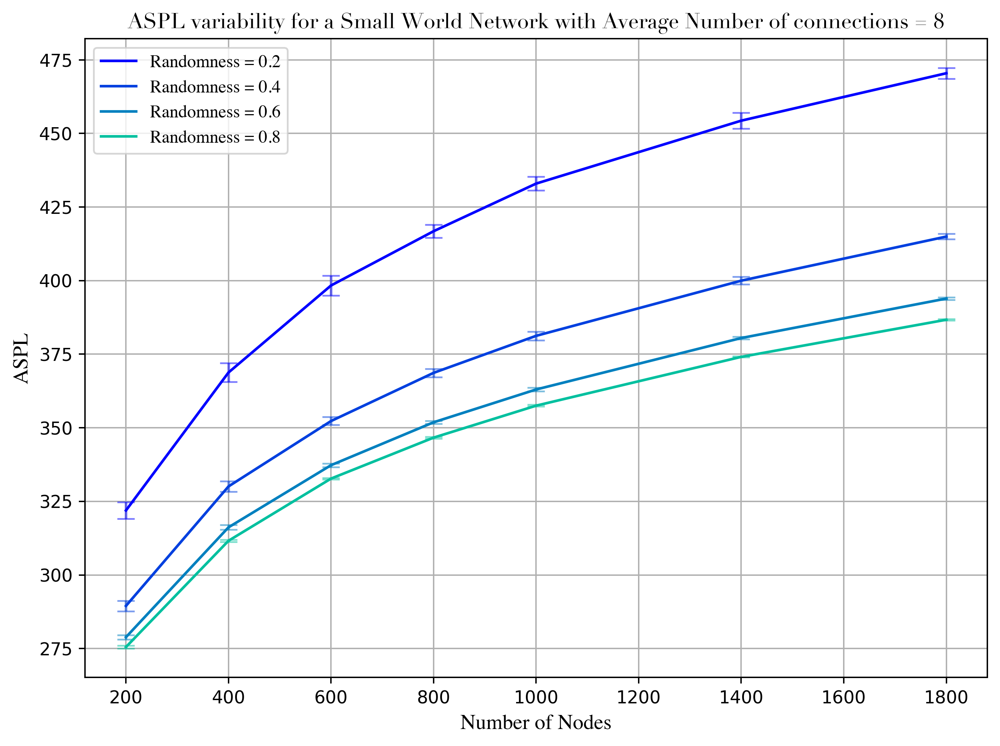

In [28]:
# Effect of varying number of nodes, constant connection

for c in con_vals:
    plt.figure(figsize=(8, 6), dpi = 350)
    plt.title('ASPL variability for a Small World Network with Average Number of connections = {}'.format(c), fontsize = 12, **csfont)
    for r in range(len(r_vals)):
        valid_data_p = df_v[(df_v['Small World Randomness'] ==  r_vals[r]) & (df_v['Average Number of Connections'] == c)]
        valid_data_p['Mean ASPL'] = valid_data_p['Mean ASPL']*100
        valid_data_p['Std. Dev ASPL'] = valid_data_p['Std. Dev ASPL'] * 100
        plt.plot(valid_data_p['Number of Nodes'], valid_data_p['Mean ASPL'], color = cm.winter(r/len(r_vals)), label = 'Randomness = {}'.format(r_vals[r]))
        plt.errorbar(valid_data_p['Number of Nodes'], valid_data_p['Mean ASPL'], yerr = valid_data_p['Std. Dev ASPL'], ls = '', capsize = 5, color = cm.winter(r/len(r_vals)), alpha = 0.5)
    plt.legend(prop = font)
    plt.xlabel('Number of Nodes', fontsize = 12, **hfont)
    plt.ylabel('ASPL',fontsize = 12,  **hfont)
    plt.grid()
    plt.tight_layout()
    plt.show()

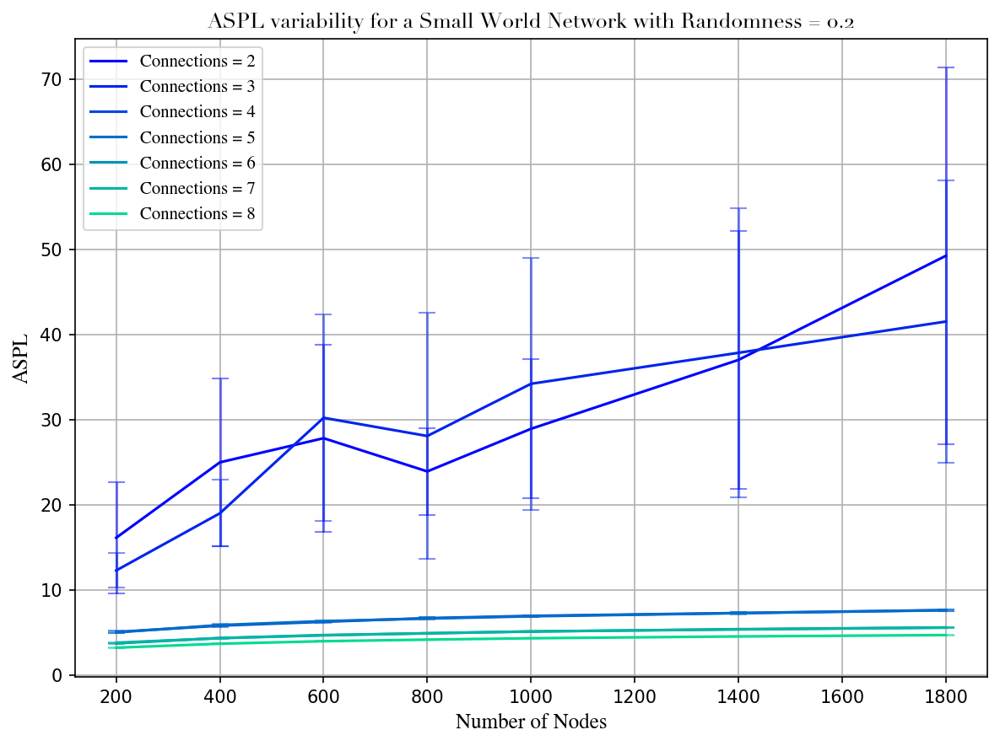

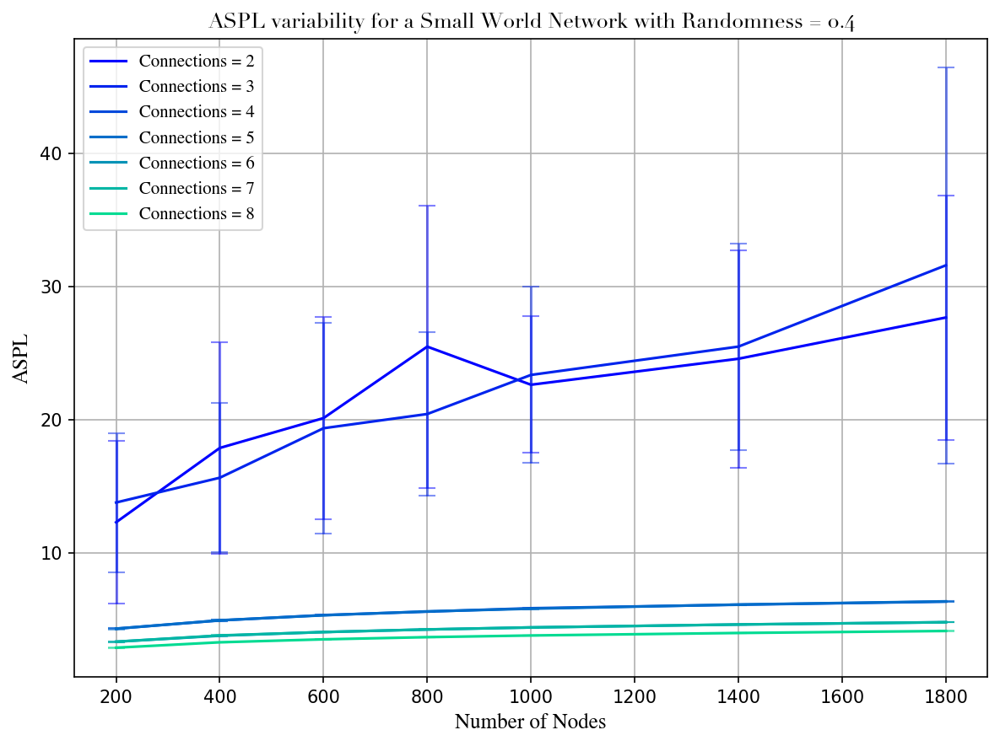

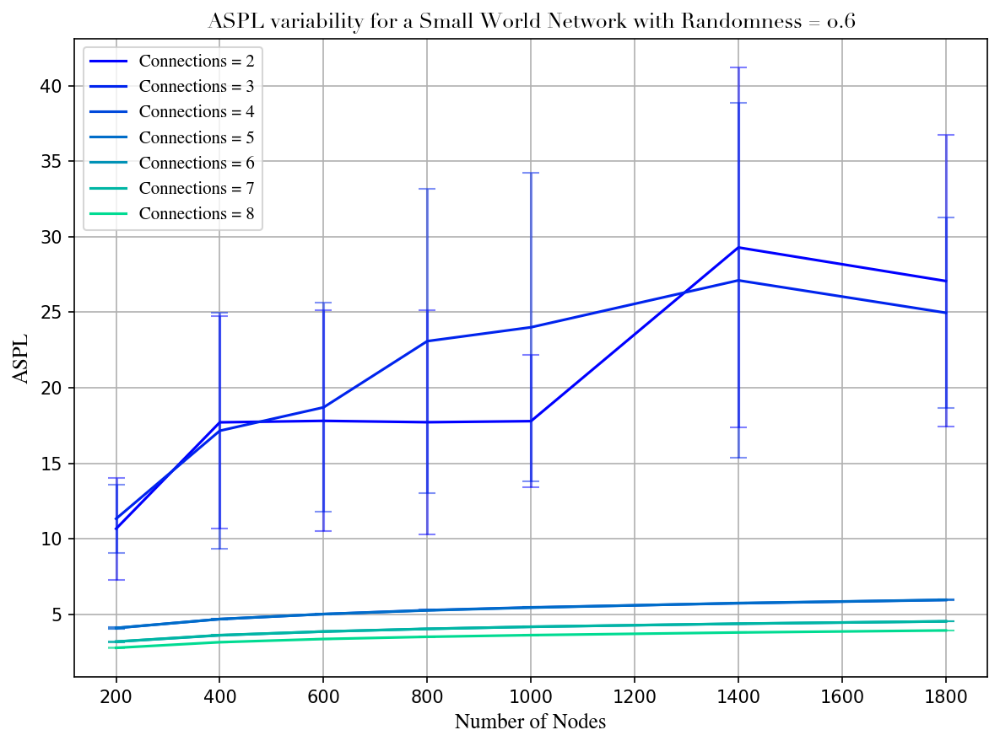

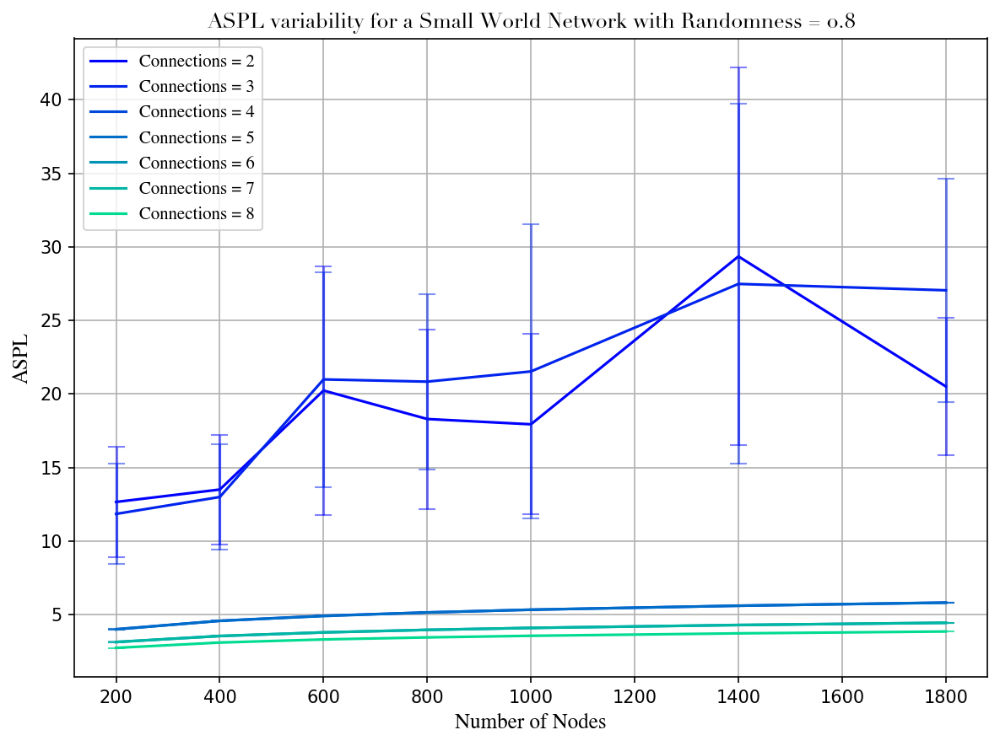

In [32]:
# Effect of varying number of nodes, constant randomness

for r in r_vals:
    plt.figure(figsize=(8, 6), dpi = 150)
    plt.title('ASPL variability for a Small World Network with Randomness = {}'.format(r), fontsize = 12, **csfont)
    for c in range(len(con_vals)):
        valid_data_p = df_v[(df_v['Small World Randomness'] ==  r) & (df_v['Average Number of Connections'] == con_vals[c])]
        plt.plot(valid_data_p['Number of Nodes'], valid_data_p['Mean ASPL'], color = cm.winter(c/len(con_vals)), label = 'Connections = {}'.format(con_vals[c]))
        plt.errorbar(valid_data_p['Number of Nodes'], valid_data_p['Mean ASPL'], yerr = valid_data_p['Std. Dev ASPL'], ls = '', capsize = 5, color = cm.winter(c/len(con_vals)), alpha = 0.5)
    plt.legend(prop = font)
    plt.xlabel('Number of Nodes', fontsize = 12, **hfont)
    plt.ylabel('ASPL',fontsize = 12,  **hfont)
    plt.grid()
    # plt.yscale('log')
    plt.tight_layout()
    plt.show()